In [115]:
import copy
import math
import scimap
import glasbey
import numpy as np
import pandas as pd
import anndata as ad
import seaborn as sns
import statsmodels.api as sm
import PyComplexHeatmap as pch
import matplotlib.pyplot as plt
from spatial_analysis.utils import ObsHelper
from scipy.stats import shapiro, ttest_ind, mannwhitneyu

import warnings
warnings.filterwarnings(action='once')

plt.rcParams['svg.fonttype'] = 'none'

In [116]:
# Make the PyComplexHeatmaps of the nb proportions
makePlots = True

## Run the Metrics Framework

Run the spatialMetricFramework in the feature_generation folder with the following config dictionary:

## Combine the Parallel Runs of the Framework

In [3]:
def addKeyedFeatures(adata_, adata_temp, ind):
    for key in adata_temp.obsm.keys():   
        adata_.obsm[key][adata_.uns['patientIndices'][ind]] = adata_temp.obsm[key][adata_temp.uns['patientIndices'][ind]]
    return adata_

def iterateAndCopyAll(adata_):
    patients = [a for a, _ in adata_.uns['patientIndices'].items()]
    
    for i, pat in enumerate(patients):
        print(pat, " -- ", i, " / ", len(patients))
        adata_temp = ad.read_h5ad(f'AnnDataFiles/patientAnnData_withMPN_{pat}.h5ad')
        adata_ = addKeyedFeatures(adata_, adata_temp, pat)       

    return adata_

remerge_the_jobs = True
if remerge_the_jobs == True:
    adata_patientAnnDataMerged = ad.read_h5ad(f'AnnDataFiles/patientAnnData_withMPN_34688.h5ad')
    adata_patientAnnDataMerged = iterateAndCopyAll(adata_patientAnnDataMerged)
    adata_patientAnnDataMerged.write_h5ad('AnnDataFiles/4-patientAnnData_NSCLC_merged.h5ad')
    adata_patientAnnDataMerged
else:
    adata_patientAnnDataMerged = ad.read_h5ad('AnnDataFiles/4-patientAnnData_NSCLC_merged.h5ad')

## Read the Previous Feature AnnData

In [5]:
adata = ad.read_h5ad(r'AnnDataFiles/3-output_nsclc_ytma_features_preandpost_withMetabolicFeatures.h5ad')
adata = adata[~np.isnan(adata.obs['CB6'])]

adata

View of AnnData object with n_obs × n_vars = 135346 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfraction

In [7]:
adata = adata[adata.obs.celltypes != 'artifactcells']

In [8]:
for pat, patadata in adata.obs.groupby(by='patientid'):
    print(pat, '\t', patadata.prepost.iloc[0])

3892 	 Pre
22193 	 Pre
22333 	 Pre
24490 	 Pre
28757 	 Pre
29937 	 Pre
31267 	 Pre
31565 	 Pre
31584 	 Pre
31590 	 Pre
32054 	 Pre
32340 	 Pre
32343 	 Pre
32350 	 Pre
32372 	 Pre
32749 	 Pre
32761 	 Pre
34668 	 Pre
34670 	 Pre
34672 	 Pre
34673 	 Pre
34678 	 Pre
34680 	 Pre
34686 	 Pre
34687 	 Pre
34688 	 Pre
34689 	 Pre
34692 	 Pre
34693 	 Pre
34694 	 Pre
34695 	 Pre
34697 	 Pre
34698 	 Pre
34699 	 Pre
34700 	 Pre
34703 	 Pre
34704 	 Pre
34706 	 Pre
34711 	 Pre
34713 	 Pre
34715 	 Pre
34718 	 Pre
34721 	 Pre
34722 	 Pre
34726 	 Pre
34733 	 Pre
34737 	 Pre
34738 	 Pre
34743 	 Pre
34746 	 Pre
34749 	 Pre
34758 	 Pre
34759 	 Pre
34765 	 Pre
34767 	 Pre


/tmp/ipykernel_405737/2022465986.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for pat, patadata in adata.obs.groupby(by='patientid'):


## Compute Cell Proportions in Cores and NBs

In [9]:
def calculatepropsinnbs(adata, nb_col, ct_col, sample_id):
    agg_helper = ObsHelper(adata, [nb_col, sample_id]) # By core + neighborhood operations
    df= agg_helper.get_metadata_df(ct_col, skey_handle="category_proportions")
    df = df.reset_index().melt(id_vars=[sample_id, nb_col],value_vars=set(adata.obs[ct_col])).pivot(index=sample_id, columns = [ct_col,nb_col], values = 'value').fillna(0)
    df = single_index(df)
    return df

def single_index(data):
    single_indexed = data.columns.map(lambda x: ":".join(x))
    data.columns = single_indexed
    return data

In [10]:
#sample level proportions
samplepropshelper = ObsHelper(adata, "patientid")
sampleproportions = {}
ctcols = ['celltypes','Immune_func','Immune_meta','tumour_meta','tumour_func', 'cell_types_immune_metapath']#
for ctcol in ctcols:
    sampleproportions[f"{ctcol}"] = samplepropshelper.get_metadata_df(
    [ctcol], 
    skey_handle="category_proportions")
    
adata.uns['proportions']={}
adata.uns['proportions']['sampleproportions'] = sampleproportions.copy()

/tmp/ipykernel_405737/2953599231.py:10: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['proportions']={}


In [11]:
sampleproportions

{'celltypes': celltypes    bcells  cd4tcells  cd4tregcells  cd8tcells  endothilialcells  \
 patientid                                                                   
 3892       0.001313   0.034136      0.001751   0.012254          0.020131   
 22193      0.015355   0.010557      0.009597   0.017274          0.015355   
 22333      0.031178   0.187837      0.034642   0.034642          0.040031   
 24490      0.008934   0.060155      0.011912   0.006552          0.025610   
 28757      0.000848   0.009330      0.000424   0.004241          0.021204   
 29937      0.012454   0.068498      0.016850   0.047253          0.017949   
 31267      0.008105   0.105365      0.019684   0.081050          0.044770   
 31565      0.024986   0.128817      0.004997   0.027207          0.058856   
 31584      0.000000   0.022616      0.007946   0.070293          0.050733   
 31590      0.001100   0.048928      0.010445   0.019241          0.169324   
 32054      0.000495   0.021277      0.002474   0.0

In [12]:
#neighbourhood level proportions
adata.obs['MetaPathNeighbourhood'] = adata.obs['MetaPathNeighbourhood'].astype(str)

nb_cols = ['nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'MetaPathNeighbourhood']
ct_cols = ['Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'celltypes', 'cell_types_immune_metapath']

nbproportions = {}
for nb in nb_cols:
    for ct in ct_cols:
        nbproportions[f"{nb}:{ct}"] = calculatepropsinnbs(adata, nb, ct, sample_id ='patientid')
import warnings
warnings.filterwarnings(action='once')

adata.uns['proportions']['nbproportions'] = nbproportions.copy()

In [15]:
#prepatids = [3892, 22193, 22333, 24481, 24490, 27405, 28757, 29937, 31267, 31565, 31579, 31584, 31590, 32054, 32340, 32343, 32345, 32350, 32356, 32362, 32364, 32370, 32372, 32749, 32761, 34668, 34670, 34672, 34673, 34678, 34680, 34681, 34686, 34687, 34688, 34689, 34692, 34693, 34694, 34695, 34697, 34698, 34699, 34700, 34703, 34704, 34706, 34711, 34713, 34714, 34715, 34718, 34721, 34722, 34726, 34733, 34737, 34738, 34742, 34743, 34746, 34747, 34749, 34750, 34752, 34753, 34758, 34759, 34765, 34767]
#lungPrimaryids = [3892, 22193, 22333, 24490, 28757, 29937, 31257, 31267, 31565, 31584, 31590, 32054, 32340, 32343, 32350, 32372, 32749, 32761, 34668, 34670, 34672, 34673, 34678, 34680, 34686, 34687, 34688, 34689, 34692, 34693, 34694, 34695, 34697, 34698, 34699, 34700, 34703, 34704, 34706,34711, 34713, 34715, 34718, 34721, 34722, 34726, 34733, 34737, 34738, 34743, 34746, 34749, 34758, 34759, 34765, 34767]
#def filterAData(adata):
#    # List of Patient IDs that are taken Pre-IO 
#    #X = X.loc[X.patientid.isin(prepatids) & X.patientid.isin(lungPrimaryids),:]
#    return adata[adata.obs['patientid'].isin(prepatids) & adata.obs['patientid'].isin(lungPrimaryids)]

<Axes: xlabel='patientid'>

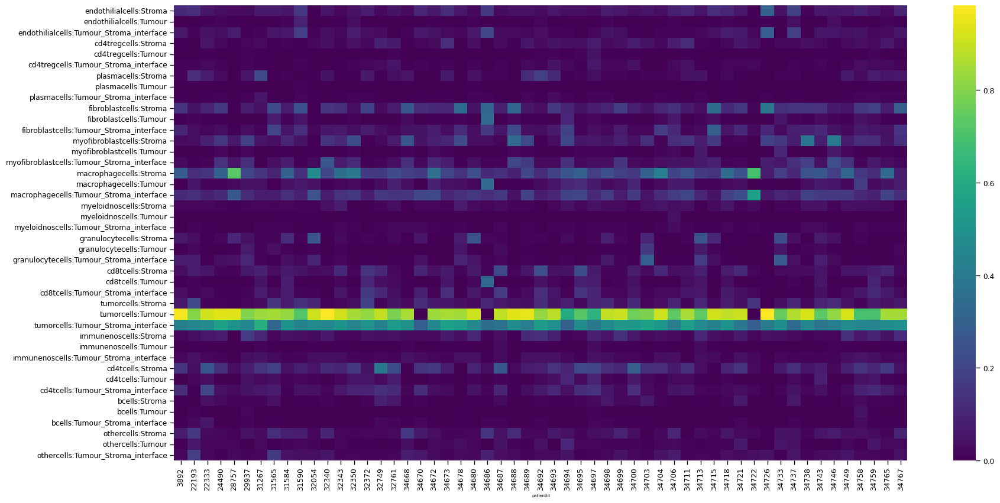

In [16]:
sns.set_context("paper", rc={"font.size":8,"axes.titlesize":8,"axes.labelsize":5})   

plt.figure(figsize=(20, 10))
sns.heatmap(filterAData(adata).uns['proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes'].T, cmap='viridis')

<Axes: xlabel='patientid', ylabel='celltypes'>

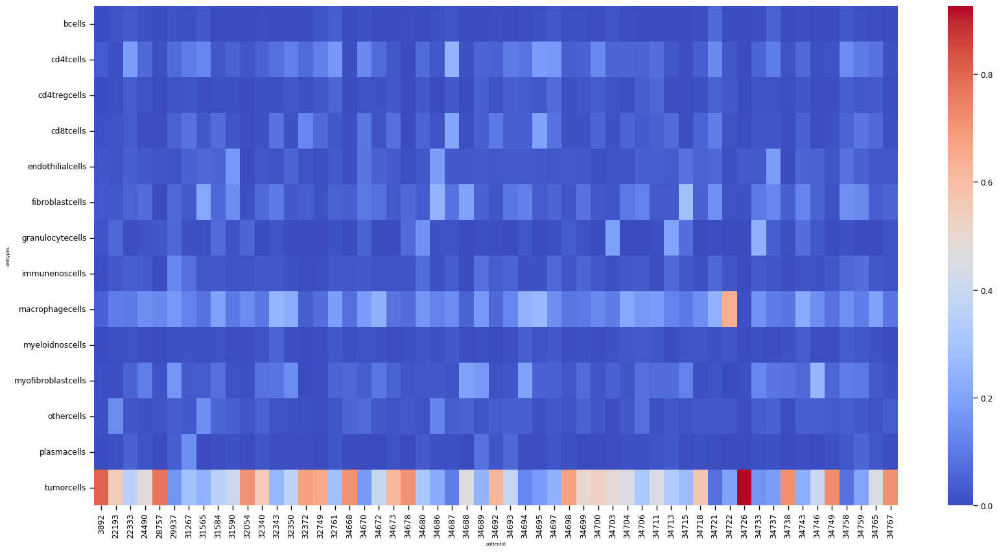

In [17]:
sns.set_context("paper", rc={"font.size":8,"axes.titlesize":8,"axes.labelsize":5})   

plt.figure(figsize=(20, 10))
sns.heatmap(filterAData(adata).uns['proportions']['sampleproportions']['celltypes'].T, cmap='coolwarm')

# Make Scimap Interaction Scores

In [18]:
import sys
import scimap

In [19]:
adata

AnnData object with n_obs × n_vars = 135264 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfractions_Metabo

In [21]:
# Radius method for 2D data with absolute p-value calculation
scimapdf = pd.DataFrame()
for pat in adata.obs['patientid'].unique():
    print("Patient: ", pat)
    padata = adata[adata.obs['patientid'] == pat]
    grouping_comparisons, pval_comparisons, mask_comparisons = scimap.spatial_interaction(padata, x_coordinate='x', y_coordinate='y',
                                knn=50, permutation=500, grouping='nb_tumournontumour_50_2', pval_method='zscore', phenotype='celltypes')
    grouping_comparisons.index = [f"{i}:{j}" for i, j in grouping_comparisons.index]
    grouping_comparisons = grouping_comparisons.stack()  # This creates a Series with a MultiIndex (original index, column)
    grouping_comparisons.index = grouping_comparisons.index.map(':'.join) 
    grouping_comparisons.index = "smi:" + grouping_comparisons.index
    grouping_comparisons = pd.DataFrame(grouping_comparisons, columns=[pat])
    scimapdf = pd.concat([scimapdf, grouping_comparisons], axis=1)

adata.uns["scimap_interaction_results_CNs"] = scimapdf

Patient:  34678
Patient:  31590
Patient:  22193
Patient:  34668
Patient:  34686
Patient:  34688
Patient:  31565
Patient:  32372
Patient:  34738
Patient:  34692
Patient:  34759
Patient:  28757
Patient:  34718
Patient:  34726
Patient:  34758
Patient:  34711
Patient:  34687
Patient:  34767
Patient:  34749
Patient:  32054
Patient:  34680
Patient:  34694
Patient:  34713
Patient:  34673
Patient:  34695
Patient:  34693
Patient:  32340
Patient:  34700
Patient:  32749
Patient:  34689
Patient:  34697
Patient:  34704
Patient:  34722
Patient:  31267
Patient:  34715
Patient:  34706
Patient:  34670
Patient:  22333
Patient:  34672
Patient:  34765
Patient:  24490
Patient:  34698
Patient:  3892
Patient:  32350
Patient:  32343
Patient:  34743
Patient:  34737
Patient:  29937
Patient:  34703
Patient:  34746
Patient:  32761
Patient:  34699
Patient:  34721
Patient:  31584
Patient:  34733


/tmp/ipykernel_405737/4005661698.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tempdf = filterAData(adata).obs.groupby(by='patientid').mean(numeric_only=True)


Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm
Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


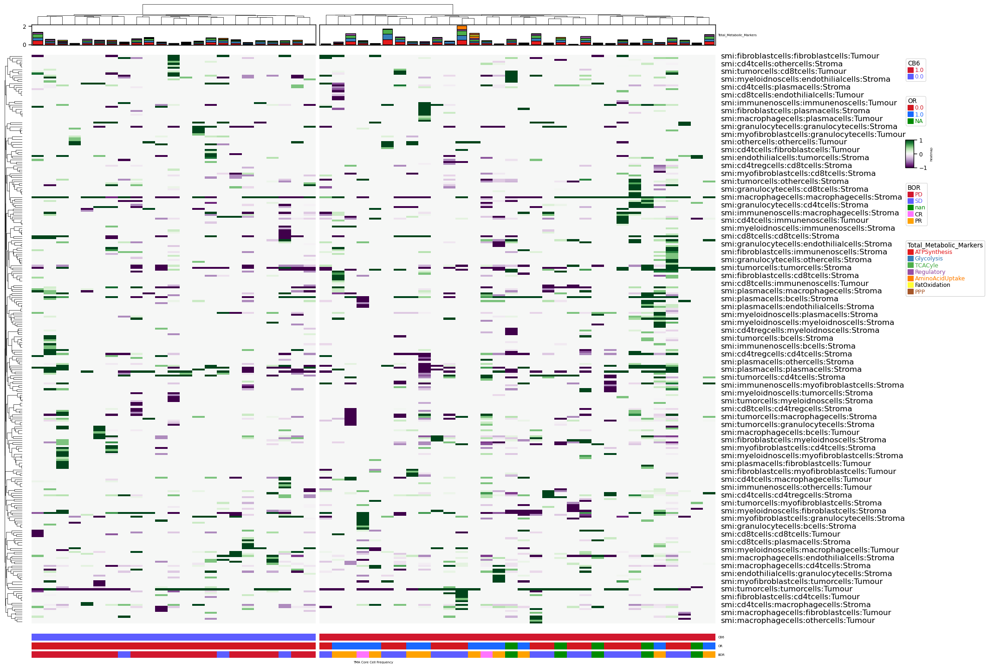

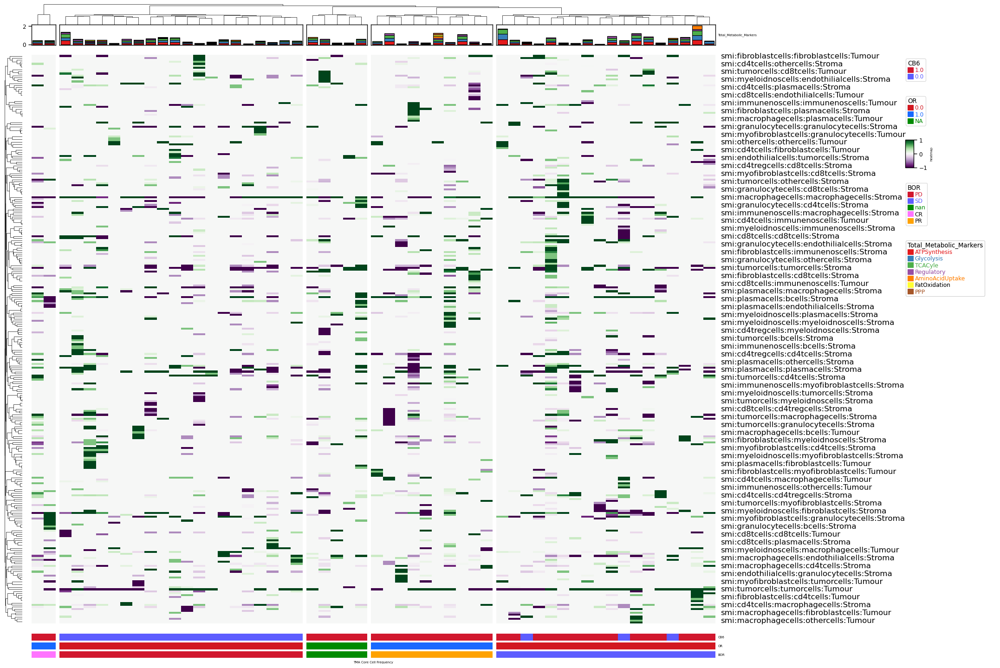

In [23]:
helper = ObsHelper(filterAData(adata), "patientid")

#create metadata
CB6 = helper.get_metadata_df('CB6').fillna('NA').astype(str)
OR = helper.get_metadata_df('OR').fillna('NA').astype(str)
BOR = helper.get_metadata_df('BOR').astype(str).fillna('NA').astype(str)
PFS = helper.get_metadata_df('pfs.E').fillna('NA').astype(str)
OS = helper.get_metadata_df('os.E').fillna('NA').astype(str)

tempdf = filterAData(adata).obs.groupby(by='patientid').mean(numeric_only=True)

which = tempdf.value_counts()
top_annot = pch.HeatmapAnnotation(
    Total_Metabolic_Markers=pch.anno_barplot(tempdf[['ATPSynthesis', 'Glycolysis', 'TCACyle',
       'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP']], legend=True),
)

# CB6 colormap
pal_length = len(CB6.index)
ct_cols = set(CB6.CB6)
cb6_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

#OR colormap
pal_length = len(OR.index)
ct_cols = set(OR.OR)
or_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=64)))

# BOR colormap
pal_length = len(BOR.index)
ct_cols = set(BOR.BOR)
bor_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

row_kwargs = {
    "CB6": pch.anno_simple(CB6.fillna('NA').astype(str), colors=cb6_cols, height=4), # height of the bar
    "OR":  pch.anno_simple(OR.astype(str).fillna('NA'),  colors=or_cols,  height=4), # height of the bar
    "BOR": pch.anno_simple(BOR.astype(str).fillna('NA').astype(str), colors=bor_cols, height=4), # height of the bar
} # height of the bar

metadata_annotation = pch.HeatmapAnnotation(
    axis=1, wgap=1, hgap=1, **row_kwargs)

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    filterAData(adata).uns["scimap_interaction_results_CNs"].T.loc[:,filterAData(adata).uns["scimap_interaction_results_CNs"].T.std(axis=0) > 1e-2].fillna(0.0).T, # transpoe with .T So columns are cores
    cmap='PRGn',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=CB6,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,    
    top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
plt.savefig('clustermap_smifeatures_CNs_CB6.svg')

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    filterAData(adata).uns["scimap_interaction_results_CNs"].T.loc[:,filterAData(adata).uns["scimap_interaction_results_CNs"].T.std(axis=0) > 1e-2].fillna(0.0).T, # transpoe with .T So columns are cores
    cmap='PRGn',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=BOR,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,    
    top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
#plt.savefig('clustermap_smifeatures_CNs_BOR.svg')

<Axes: >

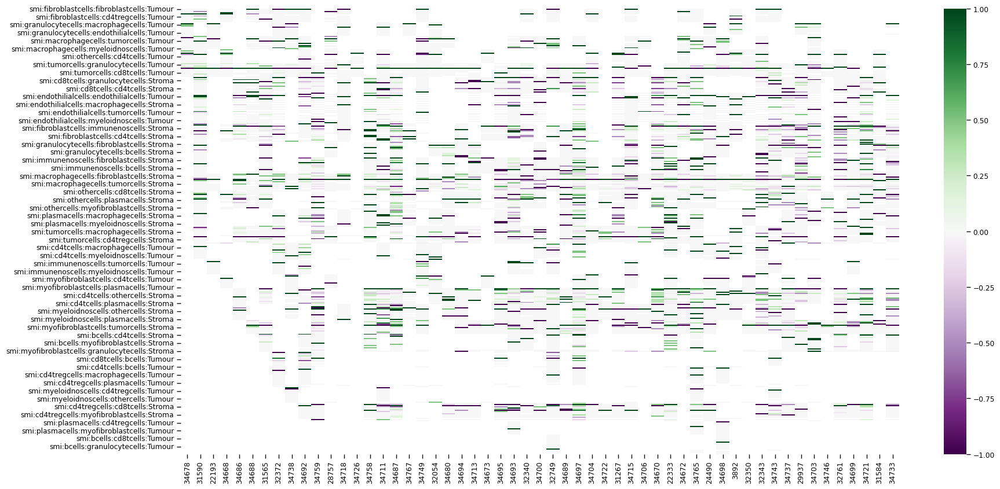

In [24]:
plt.figure(figsize=(20,10))
sns.heatmap(filterAData(adata).uns["scimap_interaction_results_CNs"], cmap='PRGn')

In [26]:
# Radius method for 2D data with absolute p-value calculation
scimapdf_MBN = pd.DataFrame()
for pat in adata.obs['patientid'].unique():
    print("Patient: ", pat)
    padata = adata[adata.obs['patientid'] == pat]
    grouping_comparisons, pval_comparisons, mask_comparisons = scimap.spatial_interaction(padata, x_coordinate='x', y_coordinate='y',
                                knn=50, permutation=500, grouping='MetaPathNeighbourhood', pval_method='zscore', phenotype='celltypes')
    grouping_comparisons.index = [f"{i}:{j}" for i, j in grouping_comparisons.index]
    grouping_comparisons = grouping_comparisons.stack()  # This creates a Series with a MultiIndex (original index, column)
    grouping_comparisons.index = grouping_comparisons.index.map(':'.join) 
    grouping_comparisons.index = "smi:" + grouping_comparisons.index
    grouping_comparisons = pd.DataFrame(grouping_comparisons, columns=[pat])
    scimapdf_MBN = pd.concat([scimapdf_MBN, grouping_comparisons], axis=1)

adata.uns["scimap_interaction_results_MBNs"] = scimapdf_MBN

Patient:  34678
Patient:  31590
Patient:  22193
Patient:  34668
Patient:  34686
Patient:  34688
Patient:  31565
Patient:  32372
Patient:  34738
Patient:  34692
Patient:  34759
Patient:  28757
Patient:  34718
Patient:  34726
Patient:  34758
Patient:  34711
Patient:  34687
Patient:  34767
Patient:  34749
Patient:  32054
Patient:  34680
Patient:  34694
Patient:  34713
Patient:  34673
Patient:  34695
Patient:  34693
Patient:  32340
Patient:  34700
Patient:  32749
Patient:  34689
Patient:  34697
Patient:  34704
Patient:  34722
Patient:  31267
Patient:  34715
Patient:  34706
Patient:  34670
Patient:  22333
Patient:  34672
Patient:  34765
Patient:  24490
Patient:  34698
Patient:  3892
Patient:  32350
Patient:  32343
Patient:  34743
Patient:  34737
Patient:  29937
Patient:  34703
Patient:  34746
Patient:  32761
Patient:  34699
Patient:  34721
Patient:  31584
Patient:  34733


/tmp/ipykernel_405737/1662624022.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tempdf = adata.obs.groupby(by='patientid').mean(numeric_only=True)


Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm
Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


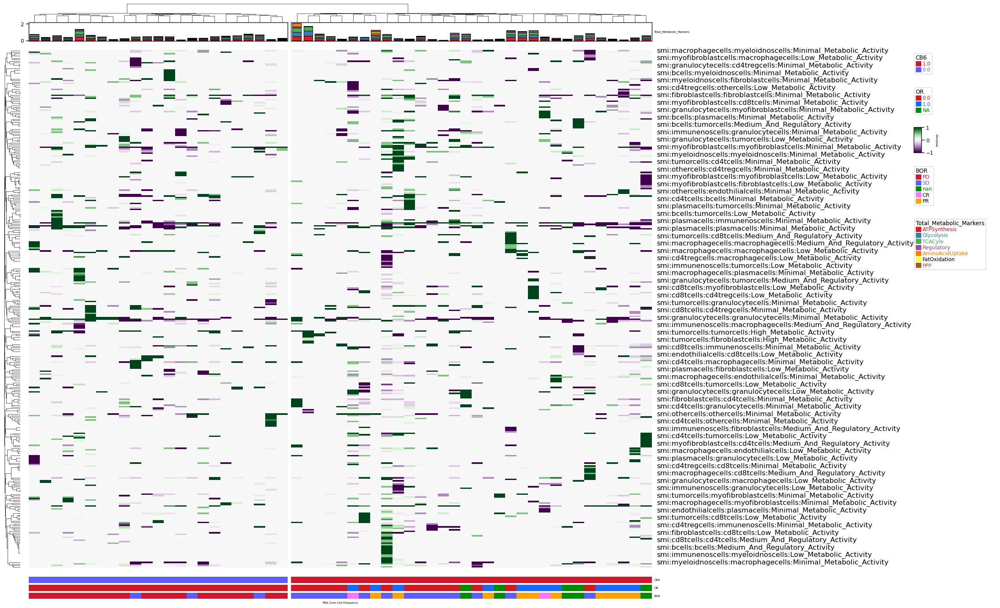

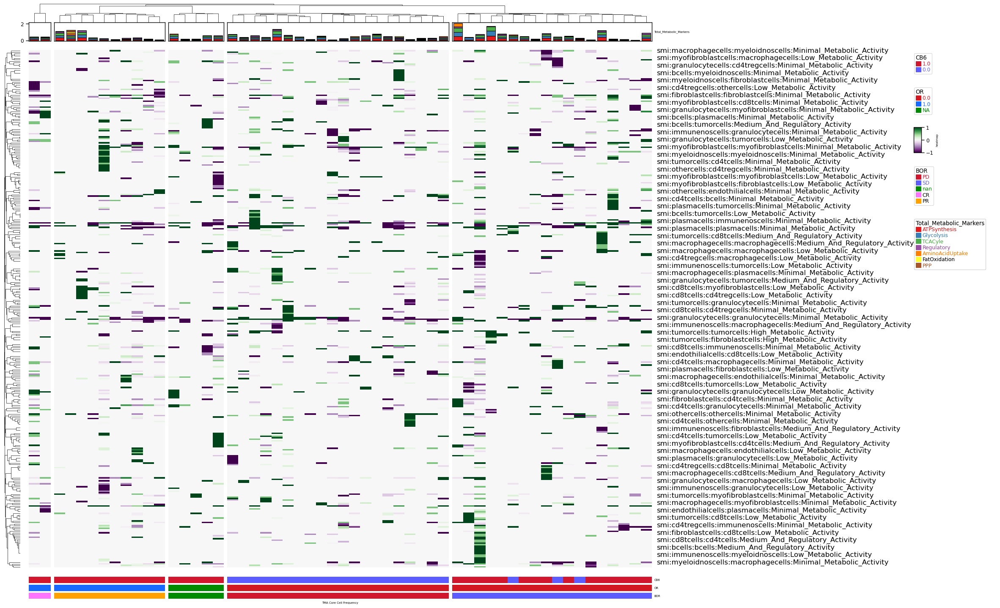

In [27]:
helper = ObsHelper(adata, "patientid")

#create metadata
CB6 = helper.get_metadata_df('CB6').fillna('NA').astype(str)
OR = helper.get_metadata_df('OR').fillna('NA').astype(str)
BOR = helper.get_metadata_df('BOR').astype(str).fillna('NA').astype(str)
PFS = helper.get_metadata_df('pfs.E').fillna('NA').astype(str)
OS = helper.get_metadata_df('os.E').fillna('NA').astype(str)

tempdf = adata.obs.groupby(by='patientid').mean(numeric_only=True)

which = tempdf.value_counts()
top_annot = pch.HeatmapAnnotation(
    Total_Metabolic_Markers=pch.anno_barplot(tempdf[['ATPSynthesis', 'Glycolysis', 'TCACyle',
       'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP']], legend=True),
)

# CB6 colormap
pal_length = len(CB6.index)
ct_cols = set(CB6.CB6)
cb6_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

#OR colormap
pal_length = len(OR.index)
ct_cols = set(OR.OR)
or_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=64)))

# BOR colormap
pal_length = len(BOR.index)
ct_cols = set(BOR.BOR)
bor_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

row_kwargs = {
    "CB6": pch.anno_simple(CB6.fillna('NA').astype(str), colors=cb6_cols, height=4), # height of the bar
    "OR":  pch.anno_simple(OR.astype(str).fillna('NA'),  colors=or_cols,  height=4), # height of the bar
    "BOR": pch.anno_simple(BOR.astype(str).fillna('NA').astype(str), colors=bor_cols, height=4), # height of the bar
} # height of the bar

metadata_annotation = pch.HeatmapAnnotation(
    axis=1, wgap=1, hgap=1, **row_kwargs)

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    scimapdf_MBN.T.loc[:,scimapdf_MBN.T.std(axis=0) > 1e-1].fillna(0.0).T, # transpoe with .T So columns are cores
    cmap='PRGn',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=CB6,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,    
    top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
#plt.savefig("clustermap_MVN_smifeatures_CB6.svg")

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    scimapdf_MBN.T.loc[:,scimapdf_MBN.T.std(axis=0) > 1e-1].fillna(0.0).T, # transpoe with .T So columns are cores
    cmap='PRGn',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=BOR,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,    
    top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
#plt.savefig("clustermap_MVN_smifeatures_BOR.svg")

<Axes: >

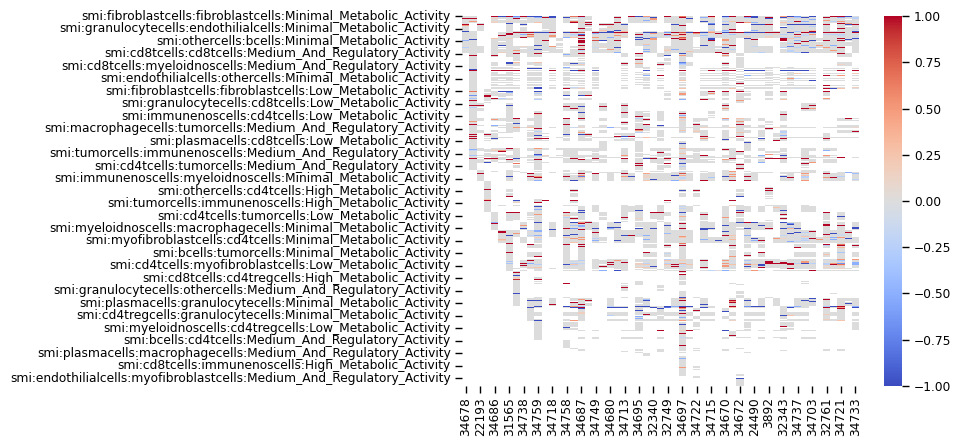

In [29]:
sns.heatmap(scimapdf_MBN, cmap='coolwarm')

## Make the Ratio of Proportions

In [30]:
def partialdiv(a, b, div_error_value=0.0):
    return np.divide(a.astype(float), b.astype(float), out=div_error_value*np.zeros((a.shape[0], a.shape[1], a.shape[1])), where=b!=0.0)
    
def proportionRatio(adata, uns_key):
    ratio_dict = {}
    
    uns = adata.uns[uns_key]
    for groupkey in uns.keys():
        ratio_dict[groupkey] = {}
        for region_phenotype_key in uns[groupkey].keys():

            orig_df = adata.uns[uns_key][groupkey][region_phenotype_key]

            result = partialdiv(orig_df.values[:, :, None], orig_df.values[:, None, :])
            #result = orig_df.values[:, :, None] / orig_df.values[:, None, :]
            reshaped = result.reshape(orig_df.shape[0], -1)

            cols = pd.MultiIndex.from_product([orig_df.columns, orig_df.columns], names=["numerator", "denominator"])
            result_df = pd.DataFrame(reshaped, columns=cols, index=orig_df.index)

            mask = result_df.columns.get_level_values("numerator") != result_df.columns.get_level_values("denominator")
            result_df = result_df.loc[:, mask]
            
            result_df.columns = [f"{num}_{den}" for num, den in result_df.columns]
            ratio_dict[groupkey][region_phenotype_key] = result_df.replace([-np.inf, np.inf], np.nan)

    adata.uns['ratio_' + uns_key] = ratio_dict
    return adata

adata = proportionRatio(adata, 'proportions')

In [31]:
adata.uns['proportions']['sampleproportions'].keys()

dict_keys(['celltypes', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath'])

## Make Proportion Heatmaps

In [32]:
helper = ObsHelper(adata, "patientid")

#create metadata
CB6 = helper.get_metadata_df('CB6')
OR = helper.get_metadata_df('OR')
BOR = helper.get_metadata_df('BOR')
PFS = helper.get_metadata_df('pfs.E')
OS = helper.get_metadata_df('os.E')

CB6[CB6['CB6'] == np.nan] = "NA"

OR = OR.astype(str)
OR [OR ['OR']  == np.str_('nan')] = "ZNA"

BOR = BOR.astype(str)
BOR[BOR['BOR'] == np.str_('nan')] = "ZNA"

# CB6 colormap
pal_length = len(CB6.index)
ct_cols = set(CB6.CB6)
cb6_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

#OR colormap
pal_length = len(OR.index)
ct_cols = set(OR.OR)
or_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=64)))

# BOR colormap
pal_length = len(BOR.index)
ct_cols = set(BOR.BOR)
bor_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

#PFS colormap
pal_length = len(PFS.index)
ct_cols = set(PFS['pfs.E'])
pfs_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=64)))

# OS colormap
pal_length = len(OS.index)
ct_cols = set(OS['os.E'])
os_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

row_kwargs = {
    "CB6": pch.anno_simple(CB6.fillna('NaN'), colors=cb6_cols, height=4), # height of the bar
    "OR":  pch.anno_simple(OR.fillna('NaN'),  colors=or_cols,  height=4), # height of the bar
    "BOR": pch.anno_simple(BOR.astype(str).fillna('NA').astype(str), colors=bor_cols, height=4), # height of the bar
} # height of the bar

In [33]:
set(OR['OR'])

{'0.0', '1.0', 'ZNA'}

In [34]:
def colorsMap(x):
    cts = set([a.split(':')[0] for a in adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes'].columns])
    #print("cts: ", cts)
    for ct, colr in zip(cts, ['k', 'r', 'g', 'b', 'tab:orange', 'tab:purple', 'm', 'y', 'c', 'tab:pink', 'tab:brown', 'tab:gray', 'goldenrod', 'teal', 'tan', 'sienna', 'olivedrab']):
        if ct in x:
            return colr
    return 'k'

top_annot = pch.HeatmapAnnotation(
    Tissue_Type_Proportions=pch.anno_barplot(adata.uns['proportions']['sampleproportions']['celltypes'], colors=[colorsMap(a) for a in adata.uns['proportions']['sampleproportions']['celltypes'].columns], legend=True, ylim=[0.0, 1.0]))

metadata_annotation = pch.HeatmapAnnotation(
    axis=1, wgap=1, hgap=1, **row_kwargs)

### Plot the Cell Type Proportions

First split by CB6

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


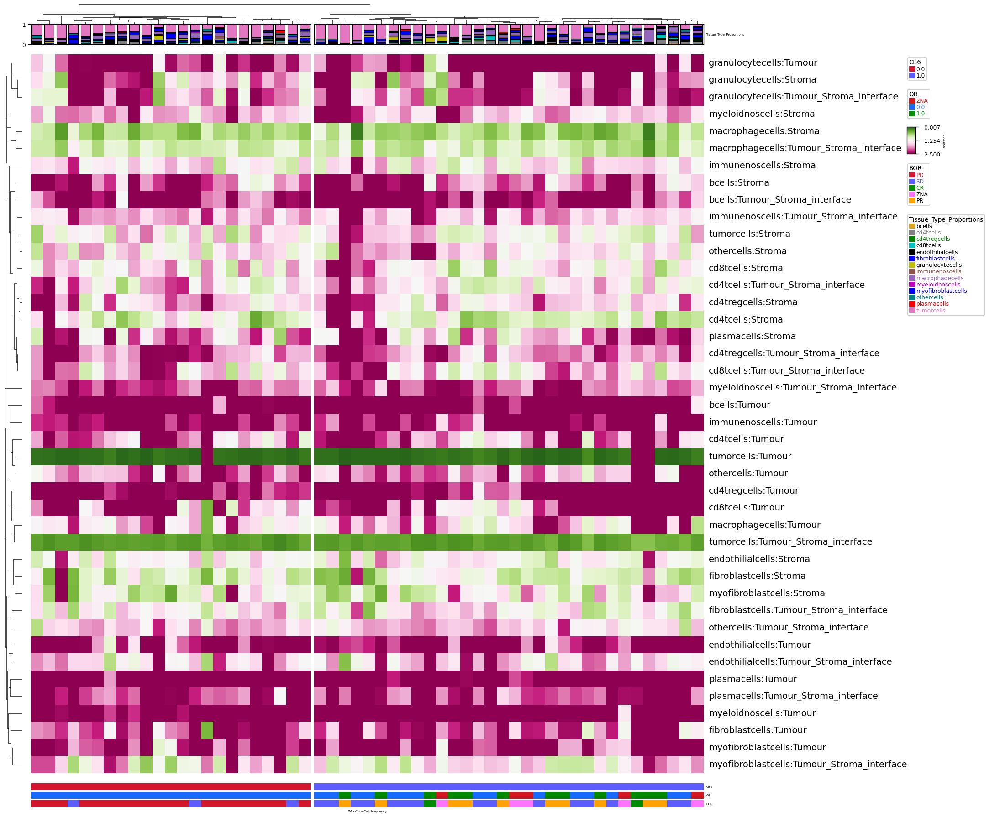

In [37]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']
tempdf = tempdf.loc[:, (tempdf != 0.0).any(axis=0)].apply(np.log10)
tempdf[np.isinf(tempdf)] = -6

if makePlots == True:
    plt.figure(figsize=(20, 20,))
    pch.ClusterMapPlotter(
        tempdf.T, # transpoe with .T So columns are cores
        cmap='PiYG',#custom_bwr, # 0 to 1 colormap
        vmin=-2.5,
        show_rownames=True,
        show_colnames=True,
        legend=True,
        yticklabels_kws=dict(labelsize=14),
        col_cluster=True, # Call once
        col_dendrogram=True,
        row_cluster=True,
        row_dendrogram=True,
        plot=True,
        col_split=CB6,
        col_split_gap=2,
        subplot_gap=5,
        bottom_annotation=metadata_annotation,    
        top_annotation=top_annot,
        xlabel = 'TMA Core Cell Frequency',
    )
#plt.savefig('nbpropCTs_CB6.svg')

In [38]:
from scipy.stats import mannwhitneyu
def mannwhit(df__, cb__):
    for col in df__.columns:
        less = df__[df__[col] <= df__[col].median()].index
        more = df__[df__[col] == df__[col].median()].index
        print(col, '\t', mannwhitneyu(cb__.loc[less,:], cb__.loc[more,:]).pvalue)

In [39]:
mannwhit(tempdf, CB6)

endothilialcells:Stroma 	 [0.29831069]
endothilialcells:Tumour 	 [1.]
endothilialcells:Tumour_Stroma_interface 	 [0.29831069]
cd4tregcells:Stroma 	 [0.36967344]
cd4tregcells:Tumour 	 [0.62874518]
cd4tregcells:Tumour_Stroma_interface 	 [0.26261829]
plasmacells:Stroma 	 [0.40538056]
plasmacells:Tumour 	 [1.]
plasmacells:Tumour_Stroma_interface 	 [0.29831069]
fibroblastcells:Stroma 	 [0.33399826]
fibroblastcells:Tumour 	 [0.51380229]
fibroblastcells:Tumour_Stroma_interface 	 [0.33399826]
myofibroblastcells:Stroma 	 [0.51380229]
myofibroblastcells:Tumour 	 [0.44120852]
myofibroblastcells:Tumour_Stroma_interface 	 [0.29831069]
macrophagecells:Stroma 	 [0.44120852]
macrophagecells:Tumour 	 [0.55098499]
macrophagecells:Tumour_Stroma_interface 	 [0.33399826]
myeloidnoscells:Stroma 	 [0.40538056]
myeloidnoscells:Tumour 	 [1.]
myeloidnoscells:Tumour_Stroma_interface 	 [0.33399826]
granulocytecells:Stroma 	 [0.55098499]
granulocytecells:Tumour 	 [0.19160111]
granulocytecells:Tumour_Stroma_interfa

In [40]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']

In [41]:
tempdf = np.log2(tempdf + 1e-5)
tempdf
#tempdf[CB6 == 1.0] - tempdf[CB6 == 1.0]

,endothilialcells:Stroma,endothilialcells:Tumour,endothilialcells:Tumour_Stroma_interface,cd4tregcells:Stroma,cd4tregcells:Tumour,cd4tregcells:Tumour_Stroma_interface,plasmacells:Stroma,plasmacells:Tumour,plasmacells:Tumour_Stroma_interface,fibroblastcells:Stroma,...,immunenoscells:Tumour_Stroma_interface,cd4tcells:Stroma,cd4tcells:Tumour,cd4tcells:Tumour_Stroma_interface,bcells:Stroma,bcells:Tumour,bcells:Tumour_Stroma_interface,othercells:Stroma,othercells:Tumour,othercells:Tumour_Stroma_interface
patientid,,,,,,,,,,,,,,,,,,,,,
3892,-3.183666,-9.166611,-4.095678,-7.704347,-16.609640,-6.831246,-6.121392,-16.609640,-7.415388,-2.800368,...,-5.832068,-2.753066,-8.170762,-3.060180,-7.704347,-16.609640,-7.415388,-3.800268,-7.298184,-5.609793
22193,-3.022251,-16.609640,-6.367315,-16.609640,-8.299229,-6.197522,-3.022251,-16.609640,-16.609640,-4.437093,...,-4.667700,-5.021899,-5.980941,-7.366124,-16.609640,-6.717299,-5.667333,-2.700346,-4.055613,-2.473609
22333,-4.148970,-7.913392,-4.409822,-4.224905,-7.913392,-5.232708,-3.653087,-16.609640,-7.346378,-3.423246,...,-5.762982,-1.926779,-4.977821,-2.275409,-4.679371,-16.609640,-4.178542,-5.434004,-5.594249,-5.762982
24490,-4.968367,-6.382500,-5.016960,-5.515646,-16.609640,-6.378796,-5.216209,-8.961457,-6.600988,-2.616745,...,-6.600988,-2.968705,-8.961457,-4.602039,-5.408778,-16.609640,-9.178966,-5.515646,-5.967764,-7.599589
28757,-5.128778,-7.043330,-3.797147,-7.711219,-16.609640,-16.609640,-16.609640,-16.609640,-8.745339,-7.711219,...,-16.609640,-4.906458,-9.733342,-5.050626,-6.712731,-16.609640,-16.609640,-6.712731,-5.989870,-5.428994
29937,-5.417423,-16.609640,-7.432135,-5.779817,-6.831246,-6.111702,-4.237196,-16.609640,-6.848003,-3.749828,...,-4.790373,-3.690538,-4.510633,-4.389932,-6.385125,-5.832068,-6.263594,-4.450146,-16.609640,-6.263594
31267,-3.857772,-16.609640,-6.427118,-5.152924,-7.389896,-7.104445,-2.203411,-16.609640,-4.180171,-4.462803,...,-4.383665,-2.811867,-5.391712,-4.035806,-6.363752,-16.609640,-8.423399,-5.057799,-5.391712,-5.968025
31565,-3.923912,-16.609640,-4.235796,-7.267681,-16.609640,-8.138886,-9.841571,-16.609640,-9.715738,-2.182378,...,-5.267933,-2.471084,-4.754498,-3.727729,-4.569124,-16.609640,-7.140920,-2.959938,-16.609640,-2.567964
31584,-4.140045,-6.773208,-4.116613,-6.037472,-16.609640,-8.433794,-6.911152,-16.609640,-8.433794,-3.664779,...,-6.630007,-4.543319,-6.773208,-7.436291,-16.609640,-16.609640,-16.609640,-3.590787,-6.773208,-4.484273


In [42]:
tempdf.loc[CB6[CB6 == 1.0].dropna().index,:].mean(0) - tempdf.loc[CB6[CB6 == 0.0].dropna().index,:].mean(0)

endothilialcells:Stroma                      -0.003239
endothilialcells:Tumour                      -0.863688
endothilialcells:Tumour_Stroma_interface     -0.075793
cd4tregcells:Stroma                           0.454711
cd4tregcells:Tumour                          -2.146891
cd4tregcells:Tumour_Stroma_interface          0.529549
plasmacells:Stroma                           -0.415996
plasmacells:Tumour                            1.145272
plasmacells:Tumour_Stroma_interface           0.836884
fibroblastcells:Stroma                        0.403361
fibroblastcells:Tumour                       -0.109108
fibroblastcells:Tumour_Stroma_interface       0.142672
myofibroblastcells:Stroma                     0.277175
myofibroblastcells:Tumour                     0.946360
myofibroblastcells:Tumour_Stroma_interface    0.714096
macrophagecells:Stroma                        0.076859
macrophagecells:Tumour                       -1.478687
macrophagecells:Tumour_Stroma_interface       0.190506
myeloidnos

In [43]:
adata.uns['proportions']['nbproportions'].keys()

dict_keys(['nb_tumournontumour_20_3:Immune_func', 'nb_tumournontumour_20_3:Immune_meta', 'nb_tumournontumour_20_3:tumour_meta', 'nb_tumournontumour_20_3:tumour_func', 'nb_tumournontumour_20_3:celltypes', 'nb_tumournontumour_20_3:cell_types_immune_metapath', 'nb_tumournontumour_50_2:Immune_func', 'nb_tumournontumour_50_2:Immune_meta', 'nb_tumournontumour_50_2:tumour_meta', 'nb_tumournontumour_50_2:tumour_func', 'nb_tumournontumour_50_2:celltypes', 'nb_tumournontumour_50_2:cell_types_immune_metapath', 'MetaPathNeighbourhood:Immune_func', 'MetaPathNeighbourhood:Immune_meta', 'MetaPathNeighbourhood:tumour_meta', 'MetaPathNeighbourhood:tumour_func', 'MetaPathNeighbourhood:celltypes', 'MetaPathNeighbourhood:cell_types_immune_metapath'])

<Axes: >

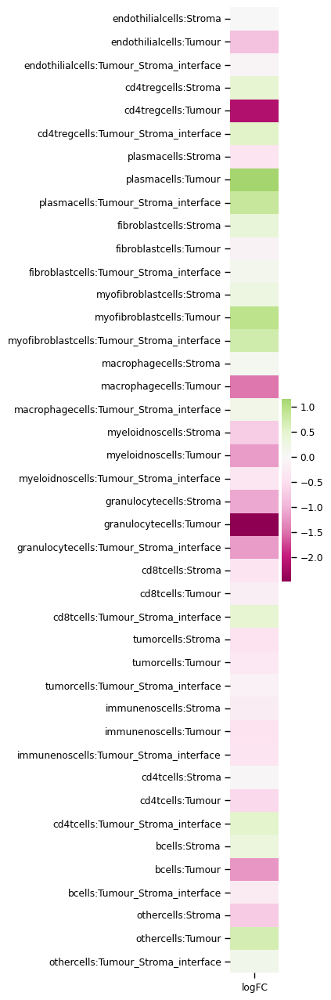

In [44]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']
tempdf = np.log2(tempdf + 1e-5)
plt.figure(figsize=(1,16))
sns.heatmap(pd.DataFrame({"logFC": tempdf.loc[CB6[CB6 == 1.0].dropna().index,:].mean(0) - tempdf.loc[CB6[CB6 == 0.0].dropna().index,:].mean(0)}), cmap='PiYG', center=0.0)
#plt.savefig('logFC_props_CNs.svg')

<Axes: >

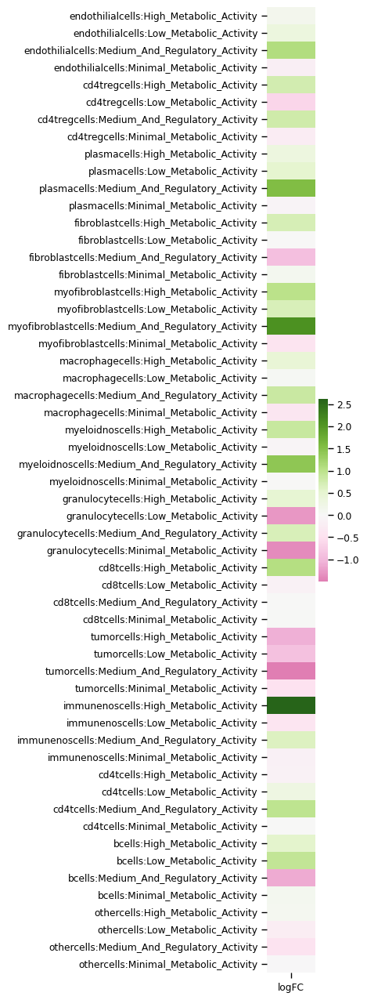

In [45]:
tempdf = adata.uns['proportions']['nbproportions']['MetaPathNeighbourhood:celltypes']
tempdf = np.log2(tempdf + 1e-5)
plt.figure(figsize=(1,16))
sns.heatmap(pd.DataFrame({"logFC": tempdf.loc[CB6[CB6 == 1.0].dropna().index,:].mean(0) - tempdf.loc[CB6[CB6 == 0.0].dropna().index,:].mean(0)}), cmap='PiYG', center=0.0)
#plt.savefig('logFC_props_MBNs.svg')

Then split by OR

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(


Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


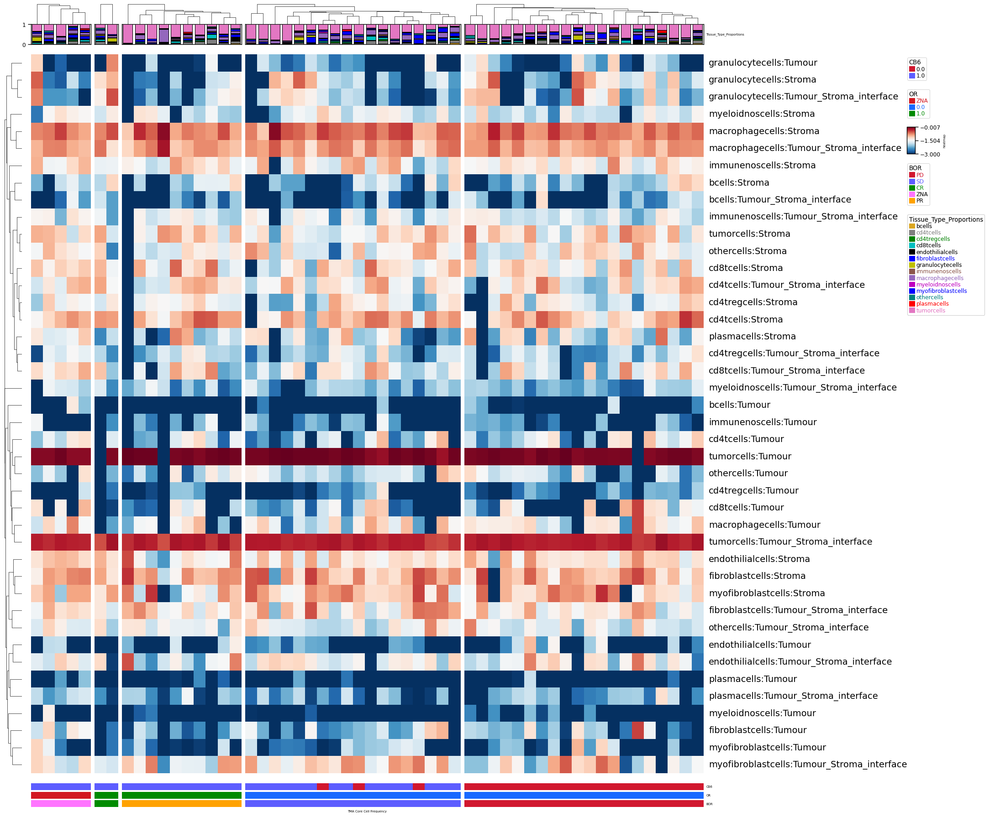

In [46]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']
tempdf = tempdf.loc[:, (tempdf != 0.0).any(axis=0)].apply(np.log10)
tempdf[np.isinf(tempdf)] = -6

if makePlots == True:
    plt.figure(figsize=(20, 20,))
    pch.ClusterMapPlotter(
        tempdf.T, # transpoe with .T So columns are cores
        cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
        vmin=-3,
        show_rownames=True,
        show_colnames=True,
        legend=True,
        yticklabels_kws=dict(labelsize=14),
        col_cluster=True, # Call once
        col_dendrogram=True,
        row_cluster=True,
        row_dendrogram=True,
        plot=True,
        col_split=BOR,
        col_split_gap=2,
        subplot_gap=5,
        bottom_annotation=metadata_annotation,    
        top_annotation=top_annot,
        xlabel = 'TMA Core Cell Frequency',
        col_split_order=['ZNA', 'CR', 'PR', 'SD', 'PD'],
    )
#plt.savefig('nbpropCTs_BOR.svg')

### Plot the Immune func proportions

First split by CB6

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


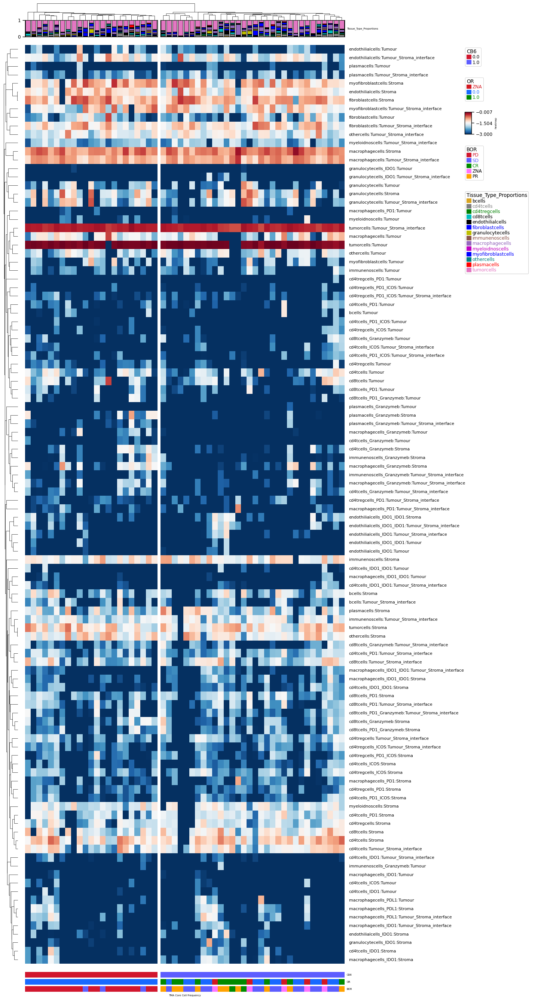

In [47]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:Immune_func']
tempdf = tempdf.loc[:, (tempdf != 0.0).any(axis=0)].apply(np.log10)
tempdf[np.isinf(tempdf)] = -10

if makePlots == True:
    plt.figure(figsize=(12, 30,))
    pch.ClusterMapPlotter(
        tempdf.T, # transpoe with .T So columns are cores
        cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
        vmin=-3,
        show_rownames=True,
        show_colnames=True,
        legend=True,
        yticklabels_kws=dict(labelsize=8, width=2),
        col_cluster=True, # Call once
        col_dendrogram=True,
        row_cluster=True,
        row_dendrogram=True,
        plot=True,
        col_split=CB6,
        col_split_gap=2,
        subplot_gap=5,
        bottom_annotation=metadata_annotation,    
        top_annotation=top_annot,
        xlabel = 'TMA Core Cell Frequency',
    )
#plt.savefig('nbpropImmuneFunc_CB6.svg')

Now split by OR

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


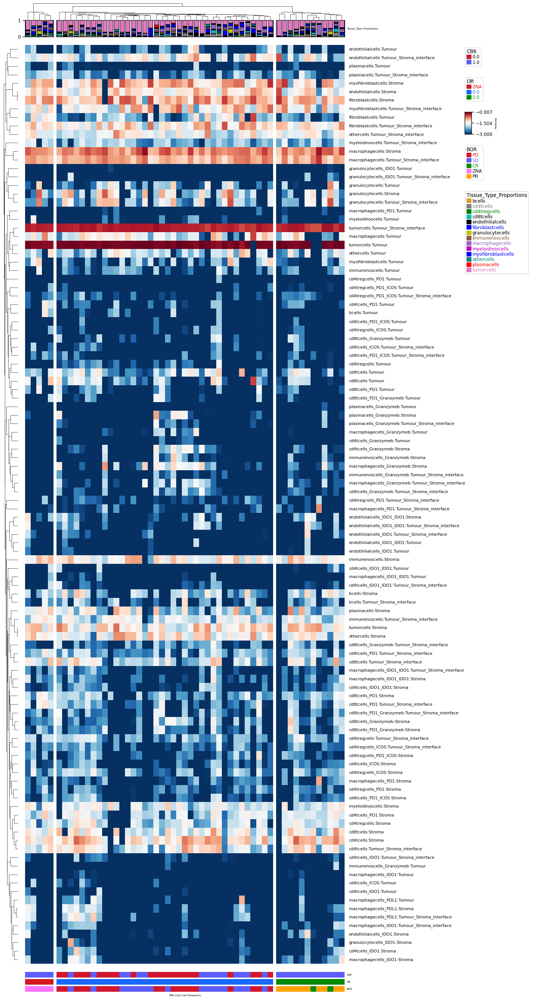

In [48]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:Immune_func']
tempdf = tempdf.loc[:, (tempdf != 0.0).any(axis=0)].apply(np.log10)
tempdf[np.isinf(tempdf)] = -10

if makePlots == True:
    plt.figure(figsize=(12, 30,))
    pch.ClusterMapPlotter(
        tempdf.T, # transpoe with .T So columns are cores
        cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
        vmin=-3,
        show_rownames=True,
        show_colnames=True,
        legend=True,
        yticklabels_kws=dict(labelsize=8),
        col_cluster=True, # Call once
        col_dendrogram=True,
        row_cluster=True,
        row_dendrogram=True,
        plot=True,
        col_split=OR,
        col_split_gap=2,
        subplot_gap=5,
        bottom_annotation=metadata_annotation,    
        top_annotation=top_annot,
        xlabel = 'TMA Core Cell Frequency',
    )
#plt.savefig('nbpropImmuneFunc_OR.svg')

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


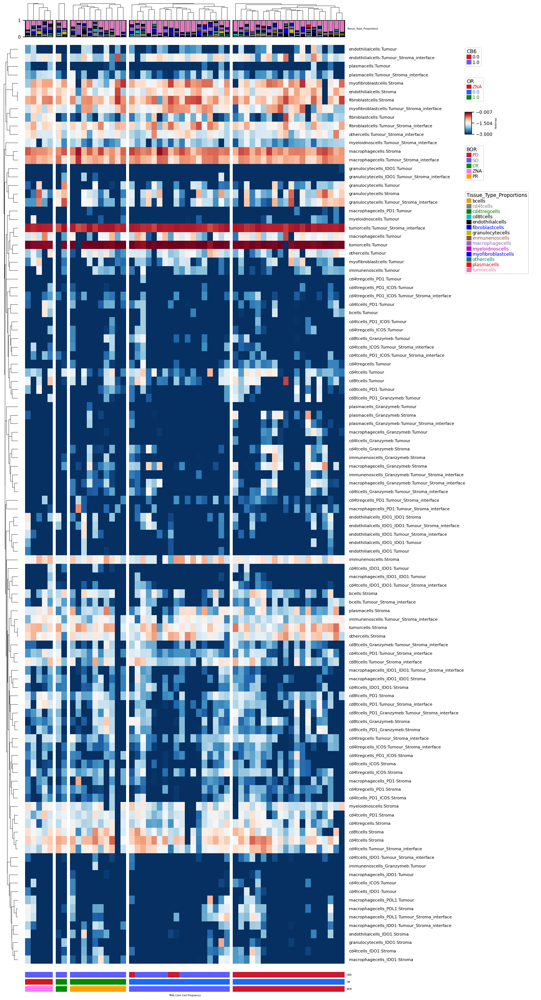

In [49]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:Immune_func']
tempdf = tempdf.loc[:, (tempdf != 0.0).any(axis=0)].apply(np.log10)
tempdf[np.isinf(tempdf)] = -10

if makePlots == True:
    plt.figure(figsize=(12, 30,))
    pch.ClusterMapPlotter(
        tempdf.T, # transpoe with .T So columns are cores
        cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
        vmin=-3,
        show_rownames=True,
        show_colnames=True,
        legend=True,
        yticklabels_kws=dict(labelsize=8),
        col_cluster=True, # Call once
        col_dendrogram=True,
        row_cluster=True,
        row_dendrogram=True,
        plot=True,
        col_split=BOR,
        col_split_gap=2,
        subplot_gap=5,
        bottom_annotation=metadata_annotation,    
        top_annotation=top_annot,
        xlabel = 'TMA Core Cell Frequency',
        col_split_order=['ZNA', 'CR', 'PR', 'SD', 'PD'],
    )
#plt.savefig('nbpropImmuneFunc_BOR.svg')

### Plot the Cell MetaPath and Func Proportions

Plot split by CB6

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


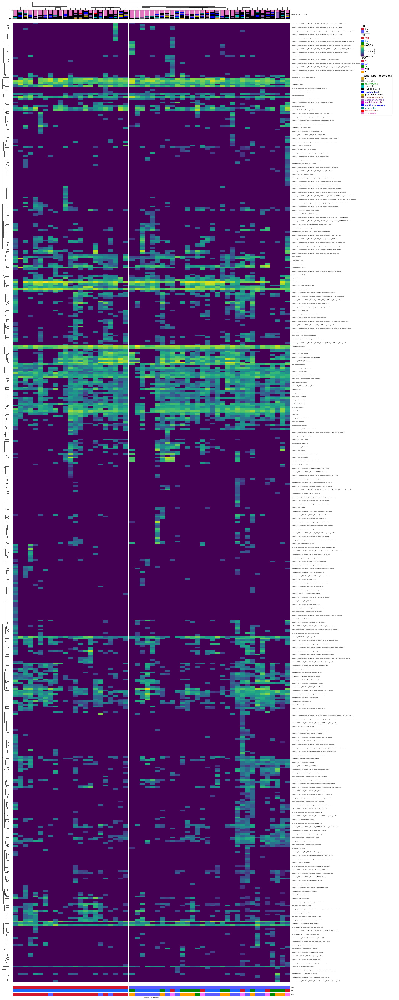

In [50]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:cell_types_immune_metapath']
tempdf = tempdf.loc[:, (tempdf != 0.0).any(axis=0)].apply(np.log10)
tempdf[np.isinf(tempdf)] = -10

if makePlots == True:
    plt.figure(figsize=(20, 60,))
    pch.ClusterMapPlotter(
        tempdf.T, # transpoe with .T So columns are cores
        cmap='viridis',#custom_bwr, # 0 to 1 colormap
        vmin=-4,
        show_rownames=True,
        show_colnames=True,
        legend=True,
        yticklabels_kws=dict(labelsize=4),
        col_cluster=True, # Call once
        col_dendrogram=True,
        row_cluster=True,
        row_dendrogram=True,
        plot=True,
        col_split=CB6,
        col_split_gap=2,
        subplot_gap=5,
        bottom_annotation=metadata_annotation,    
        top_annotation=top_annot,
        xlabel = 'TMA Core Cell Frequency',
    )
#plt.savefig('nbpropcelltypesimmunemetapath_CB6.svg')

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/squidpy/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:861: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/squidpy/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1858: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/squidpy/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:861: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/squidpy/lib/pyth

Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 49.41144444444445 mm


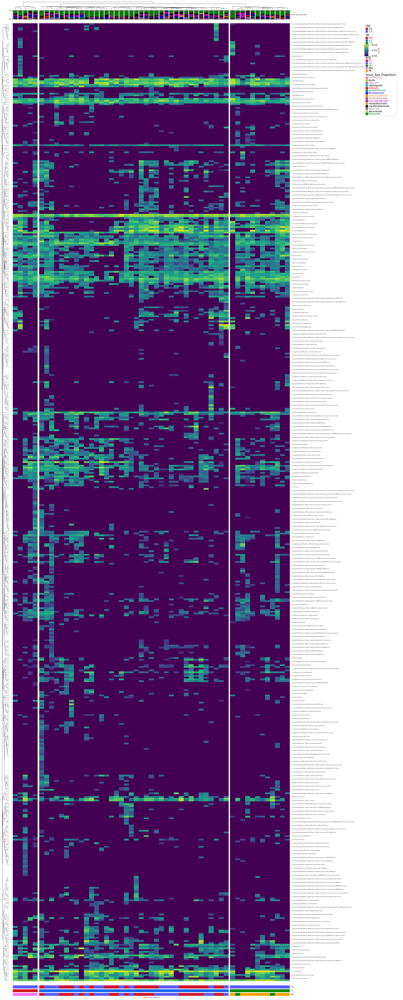

In [65]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:cell_types_immune_metapath']
tempdf = tempdf.loc[:, (tempdf != 0.0).any(axis=0)].apply(np.log10)
tempdf[np.isinf(tempdf)] = -10

if makePlots == True:
    plt.figure(figsize=(20, 60,))
    pch.ClusterMapPlotter(
        tempdf.T, # transpoe with .T So columns are cores
        cmap='viridis',#custom_bwr, # 0 to 1 colormap
        vmin=-4,
        show_rownames=True,
        show_colnames=True,
        legend=True,
        yticklabels_kws=dict(labelsize=4),
        col_cluster=True, # Call once
        col_dendrogram=True,
        row_cluster=True,
        row_dendrogram=True,
        plot=True,
        col_split=OR,
        col_split_gap=2,
        subplot_gap=5,
        bottom_annotation=metadata_annotation,    
        top_annotation=top_annot,
        xlabel = 'TMA Core Cell Frequency',
    )
plt.savefig('nbpropcelltypesimmunemetapath_OR.svg')

## Combine All Computed Features

Merge all the computed features, G-Cross, G-Cross (metabolic weighted), JSD, proportions, proportion ratios, spatial_interaction 

In [54]:
from __future__ import annotations
from typing import SupportsIndex
import numpy as np
from numpy._typing._array_like import _ArrayLikeComplex_co, _ArrayLikeTD64_co, _ArrayLikeObject_co

def nantrapz(
    y: _ArrayLikeComplex_co | _ArrayLikeTD64_co | _ArrayLikeObject_co,
    x: _ArrayLikeComplex_co | _ArrayLikeTD64_co | _ArrayLikeObject_co | None = None,
    dx: float = 1.0,
    axis: SupportsIndex = -1,
):
    y = np.asanyarray(y)
    if x is None:
        d = dx
    else:
        x = np.asanyarray(x)
        if x.ndim == 1:
            d = np.diff(x)
            # reshape to correct shape
            shape = [1] * y.ndim
            shape[axis] = d.shape[0]
            d = d.reshape(shape)
        else:
            d = np.diff(x, axis=axis)
    nd = y.ndim
    slice1 = [slice(None)] * nd
    slice2 = [slice(None)] * nd
    slice1[axis] = slice(1, None)
    slice2[axis] = slice(None, -1)
    try:
        ret = np.nansum(d * (y[tuple(slice1)] + y[tuple(slice2)]) / 2.0, axis=axis)
    except ValueError:
        # Operations didn't work, cast to ndarray
        d = np.asarray(d)
        y = np.asarray(y)
        ret = np.add.reduce(d * (y[tuple(slice1)] + y[tuple(slice2)]) / 2.0, axis)
    return ret

In [55]:
print("Keys in the Patient_AnnData structure")
[key for key, _ in adata_patientAnnDataMerged.uns.items()][1:]

Keys in the Patient_AnnData structure


['GCross_MPCNsxCellsxCells_NoNeighs_AllCells_dims',
 'GCross_MPCNsxCellsxCells_NoNeighs_EdgeCells_dims',
 'GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells_dims',
 'GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_EdgeCells_dims',
 'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_AllCells_dims',
 'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_EdgeCells_dims',
 'GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_AllCells_dims',
 'GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_EdgeCells_dims',
 'GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_AllCells_dims',
 'GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_EdgeCells_dims',
 'GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_AllCells_dims',
 'GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_EdgeCells_dims',
 'GCross_MPCNsxTumourfuncxTumourfunc_NoNeighs_AllCells_dims',
 'GCross_MPCNsxTumourfuncxTumourfunc_NoNeighs_EdgeCells_dims',
 'GCross_MPCNsxTumourmetaxTumourmeta_NoNeighs_AllCells_dims',
 'GCross_MPCNsxTumourmetaxTumourmeta_NoNeighs_EdgeCells_dims',
 'GCross_k2C

In [56]:
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

labels = []
#values, patientsArr = [], [], []
for metric in ['GCross_k2CNsxCellsxCells_NoNeighs_AllCells',   'GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_AllCells',   'GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_AllCells',   'GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells', 
               'GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_AllCells', 'GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'GCross_k3CNsxCellsxCells_NoNeighs_AllCells',   'GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_AllCells',   'GCross_k3CNsxImmunemetaxImmunemeta_NoNeighs_AllCells',   'GCross_k3CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells', 
               'GCross_k3CNsxImmunefuncxTumourfunc_NoNeighs_AllCells', 'GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'GCross_MPCNsxCellsxCells_NoNeighs_AllCells',   'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_AllCells',   'GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_AllCells',   'GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells', 
               'GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_AllCells', 'GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_AllCells',
               
               'GCross_k2CNsxCellsxCells_NoNeighs_EdgeCells',   'GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_EdgeCells',   'GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_EdgeCells',   'GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_EdgeCells', 
               'GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_EdgeCells', 'GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_EdgeCells',
               'GCross_k3CNsxCellsxCells_NoNeighs_EdgeCells',   'GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_EdgeCells',   'GCross_k3CNsxImmunemetaxImmunemeta_NoNeighs_EdgeCells',   'GCross_k3CNsxFuncmetapathxFuncmetapath_NoNeighs_EdgeCells', 
               'GCross_k3CNsxImmunefuncxTumourfunc_NoNeighs_EdgeCells', 'GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_EdgeCells',
               'GCross_MPCNsxCellsxCells_NoNeighs_EdgeCells',   'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_EdgeCells',   'GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_EdgeCells',   'GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_EdgeCells', 
               'GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_EdgeCells', 'GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_EdgeCells',
               
               'JSDScores_k2CNxCellsxCells_NoNeighs_AllCells', 'JSDScores_k2CNxImmunefuncxImmunefunc_NoNeighs_AllCells', 'JSDScores_k2CNxImmunemetaxImmunemeta_NoNeighs_AllCells', 'JSDScores_k2CNxFuncmetapathxFuncmetapath_NoNeighs_AllCells',
               'JSDScores_k2CNxImmunefuncxTumourfunc_NoNeighs_AllCells', 'JSDScores_k2CNxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'JSDScores_k3CNxImmunefuncxImmunefunc_NoNeighs_AllCells', 'JSDScores_k3CNxImmunemetaxImmunemeta_NoNeighs_AllCells', 'JSDScores_k2CNxFuncmetapathxFuncmetapath_NoNeighs_AllCells',
               'JSDScores_k3CNxImmunefuncxTumourfunc_NoNeighs_AllCells', 'JSDScores_k3CNxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'JSDScores_MPCNxCellsxCells_NoNeighs_AllCells', 'JSDScores_MPCNxImmunefuncxImmunefunc_NoNeighs_AllCells', 'JSDScores_MPCNxImmunemetaxImmunemeta_NoNeighs_AllCells', 'JSDScores_MPCNxFuncmetapathxFuncmetapath_NoNeighs_AllCells',
               'JSDScores_MPCNxImmunefuncxTumourfunc_NoNeighs_AllCells', 'JSDScores_MPCNxImmunemetaxTumourmeta_NoNeighs_AllCells',              
              ]:
    print(metric)
    labeldict  = adata_patientAnnDataMerged.uns[metric + '_dims']['dimLabels']
    valuesdict = adata_patientAnnDataMerged.uns[metric + '_dims']['dims']

    if 'Edge' in metric:
        valsArr = np.asarray(adata_patientAnnDataMerged.obsm[metric])
        valsArr = nantrapz(valsArr, x=adata_patientAnnDataMerged.uns['radii'], axis=-1)
        for indI, i in enumerate(list(labeldict['0'])):
            for indJ, j in enumerate(list(labeldict['1'])):
                for indK, k in enumerate(list(labeldict['2'])):
                    for indL, l in enumerate(list(labeldict['3'])):
                            labels.append(metric+'_'+str(i)+'_'+str(j)+'_'+str(k)+'_'+str(l))
    elif 'GCross_' in metric and 'AllCells' in metric:
        valsArr = np.asarray(adata_patientAnnDataMerged.obsm[metric])
        valsArr = nantrapz(valsArr, x=adata_patientAnnDataMerged.uns['radii'], axis=-1)
        for indI, i in enumerate(list(labeldict['0'])):
            for indJ, j in enumerate(list(labeldict['1'])):
                for indK, k in enumerate(list(labeldict['2'])):
                        labels.append(metric+'_'+str(i)+'_'+str(j)+'_'+str(k))

    elif 'JSD' in metric:
        for indI, i in enumerate(list(labeldict['0'])):
            for indJ, j in enumerate(list(labeldict['1'])):
                for indK, k in enumerate(list(labeldict['2'])):
                        labels.append(metric+'_'+str(i)+'_'+str(j)+'_'+str(k))

    else:
        print("ERROR with ", metric)

GCross_k2CNsxCellsxCells_NoNeighs_AllCells
GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_AllCells
GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_AllCells
GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells
GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_AllCells
GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_AllCells
GCross_k3CNsxCellsxCells_NoNeighs_AllCells
GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_AllCells
GCross_k3CNsxImmunemetaxImmunemeta_NoNeighs_AllCells
GCross_k3CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells
GCross_k3CNsxImmunefuncxTumourfunc_NoNeighs_AllCells
GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_AllCells
GCross_MPCNsxCellsxCells_NoNeighs_AllCells
GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_AllCells
GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_AllCells
GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells
GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_AllCells
GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_AllCells
GCross_k2CNsxCellsxCells_NoNeighs_EdgeCells
GCross_k2CNsxImmunef

In [57]:
dfPatientAnnData = pd.DataFrame({})

for metric in ['GCross_k2CNsxCellsxCells_NoNeighs_AllCells',   'GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_AllCells',   'GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_AllCells',   'GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells', 
               'GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_AllCells', 'GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'GCross_k3CNsxCellsxCells_NoNeighs_AllCells',   'GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_AllCells',   'GCross_k3CNsxImmunemetaxImmunemeta_NoNeighs_AllCells',   'GCross_k3CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells', 
               'GCross_k3CNsxImmunefuncxTumourfunc_NoNeighs_AllCells', 'GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'GCross_MPCNsxCellsxCells_NoNeighs_AllCells',   'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_AllCells',   'GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_AllCells',   'GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells', 
               'GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_AllCells', 'GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_AllCells',

               'GCross_k2CNsxCellsxCells_NoNeighs_EdgeCells',   'GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_EdgeCells',   'GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_EdgeCells',   'GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_EdgeCells', 
               'GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_EdgeCells', 'GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_EdgeCells',
               'GCross_k3CNsxCellsxCells_NoNeighs_EdgeCells',   'GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_EdgeCells',   'GCross_k3CNsxImmunemetaxImmunemeta_NoNeighs_EdgeCells',   'GCross_k3CNsxFuncmetapathxFuncmetapath_NoNeighs_EdgeCells', 
               'GCross_k3CNsxImmunefuncxTumourfunc_NoNeighs_EdgeCells', 'GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_EdgeCells',
               'GCross_MPCNsxCellsxCells_NoNeighs_EdgeCells',   'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_EdgeCells',   'GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_EdgeCells',   'GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_EdgeCells', 
               'GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_EdgeCells', 'GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_EdgeCells',
               
               'JSDScores_k2CNxCellsxCells_NoNeighs_AllCells', 'JSDScores_k2CNxImmunefuncxImmunefunc_NoNeighs_AllCells', 'JSDScores_k2CNxImmunemetaxImmunemeta_NoNeighs_AllCells', 'JSDScores_k2CNxFuncmetapathxFuncmetapath_NoNeighs_AllCells',
               'JSDScores_k2CNxImmunefuncxTumourfunc_NoNeighs_AllCells', 'JSDScores_k2CNxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'JSDScores_k3CNxImmunefuncxImmunefunc_NoNeighs_AllCells', 'JSDScores_k3CNxImmunemetaxImmunemeta_NoNeighs_AllCells', 'JSDScores_k2CNxFuncmetapathxFuncmetapath_NoNeighs_AllCells',
               'JSDScores_k3CNxImmunefuncxTumourfunc_NoNeighs_AllCells', 'JSDScores_k3CNxImmunemetaxTumourmeta_NoNeighs_AllCells',
               'JSDScores_MPCNxCellsxCells_NoNeighs_AllCells', 'JSDScores_MPCNxImmunefuncxImmunefunc_NoNeighs_AllCells', 'JSDScores_MPCNxImmunemetaxImmunemeta_NoNeighs_AllCells', 'JSDScores_MPCNxFuncmetapathxFuncmetapath_NoNeighs_AllCells',
               'JSDScores_MPCNxImmunefuncxTumourfunc_NoNeighs_AllCells', 'JSDScores_MPCNxImmunemetaxTumourmeta_NoNeighs_AllCells',              
              ]:
    print(metric)
    labeldict  = adata_patientAnnDataMerged.uns[metric + '_dims']['dimLabels']
    valuesdict = adata_patientAnnDataMerged.uns[metric + '_dims']['dims']

    if 'Edge' in metric:
        valsArr = np.array(adata_patientAnnDataMerged.obsm[metric], dtype=np.float32)
        valsArr = nantrapz(valsArr, x=adata_patientAnnDataMerged.uns['radii'], axis=-1)
        valsArr = valsArr.reshape(valsArr.shape[0], -1)

        templabels = []
        for indI, i in enumerate(list(labeldict['0'])):
            for indJ, j in enumerate(list(labeldict['1'])):
                for indK, k in enumerate(list(labeldict['2'])):
                    for indL, l in enumerate(list(labeldict['3'])):
                        templabels.append(metric+'_'+str(i)+'_'+str(j)+'_'+str(k)+'_'+str(l))
        dftemp = pd.DataFrame(valsArr, index=[_ for _,a in adata_patientAnnDataMerged.uns['patientIndices'].items()], columns=templabels, dtype=np.float32)
        dfPatientAnnData = pd.concat([dfPatientAnnData, dftemp], axis=1)
    elif 'GCross_' in metric and 'AllCells' in metric:
        valsArr = np.array(adata_patientAnnDataMerged.obsm[metric], dtype=np.float32)
        valsArr = nantrapz(valsArr, x=adata_patientAnnDataMerged.uns['radii'], axis=-1)
        valsArr = valsArr.reshape(valsArr.shape[0], -1)

        templabels = []
        for indI, i in enumerate(list(labeldict['0'])):
            for indJ, j in enumerate(list(labeldict['1'])):
                for indK, k in enumerate(list(labeldict['2'])):
                        templabels.append(metric+'_'+str(i)+'_'+str(j)+'_'+str(k))
        dftemp = pd.DataFrame(valsArr, index=[_ for _,a in adata_patientAnnDataMerged.uns['patientIndices'].items()], columns=templabels, dtype=np.float32)
        dfPatientAnnData = pd.concat([dfPatientAnnData, dftemp], axis=1)

    elif 'JSD' in metric:
        valsArr = np.array(adata_patientAnnDataMerged.obsm[metric], dtype=np.float32)
        valsArr = valsArr.reshape(valsArr.shape[0], -1)

        templabels = []
        for indI, i in enumerate(list(labeldict['0'])):
            for indJ, j in enumerate(list(labeldict['1'])):
                for indK, k in enumerate(list(labeldict['2'])):
                        templabels.append(metric+'_'+str(i)+'_'+str(j)+'_'+str(k))
        dftemp = pd.DataFrame(valsArr, index=[_ for _,a in adata_patientAnnDataMerged.uns['patientIndices'].items()], columns=templabels, dtype=np.float32)
        dfPatientAnnData = pd.concat([dfPatientAnnData, dftemp], axis=1)

GCross_k2CNsxCellsxCells_NoNeighs_AllCells
GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_AllCells
GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_AllCells
GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells
GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_AllCells
GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_AllCells
GCross_k3CNsxCellsxCells_NoNeighs_AllCells
GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_AllCells
GCross_k3CNsxImmunemetaxImmunemeta_NoNeighs_AllCells
GCross_k3CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells
GCross_k3CNsxImmunefuncxTumourfunc_NoNeighs_AllCells
GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_AllCells
GCross_MPCNsxCellsxCells_NoNeighs_AllCells
GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_AllCells
GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_AllCells
GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells
GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_AllCells
GCross_MPCNsxImmunemetaxTumourmeta_NoNeighs_AllCells
GCross_k2CNsxCellsxCells_NoNeighs_EdgeCells
GCross_k2CNsxImmunef

In [58]:
dfPatientAnnData['patientid'] = dfPatientAnnData.index

### Get Clinical Responses

In [59]:
dfClincialResponse = adata.obs[['BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'patientid']]
stuff = []
for patient, df_ in dfClincialResponse.groupby(by='patientid'):
    stuff.append(df_.iloc[0].T)
    stuff[-1]['patientid'] = str(patient)
dfClincialResponse = pd.concat(stuff, axis=1).T.reset_index(drop=True)

/tmp/ipykernel_405737/3147903210.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for patient, df_ in dfClincialResponse.groupby(by='patientid'):
/tmp/ipykernel_405737/3147903210.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stuff[-1]['patientid'] = str(patient)


In [60]:
# Merge in the clinical responses
dfPatientAnnData = pd.merge(dfPatientAnnData, dfClincialResponse, how='left', left_on='patientid', right_on='patientid')

In [61]:
dfPatientAnnData

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,CB6,PORvsFPD,pfs.T,pfs.E,os.T,os.E,pfs.6months,pfs.12months,OS.18months,OS.24months
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,0.0,0.0,2.333333,1.0,11.6,1.0,1.0,0.0,1.0,0.0
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.0,NaN,1.766667,1.0,21.333333,1.0,1.0,0.0,0.0,0.0
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,1.0,1.0,13.033333,1.0,37.9,1.0,0.0,1.0,0.0,1.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.0,1.0,7.6,1.0,27.766667,0.0,0.0,0.0,0.0,1.0
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.0,0.0,2.733333,1.0,3.866667,1.0,1.0,0.0,1.0,0.0
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,1.3,1.0,1.9,1.0,1.0,0.0,1.0,0.0
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,1.0,1.0,7.333333,1.0,28.466667,0.0,0.0,0.0,0.0,1.0
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,0.0,0.0,1.6,1.0,15.666667,1.0,1.0,0.0,1.0,0.0
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,0.0,0.0,0.666667,1.0,1.4,1.0,1.0,0.0,1.0,0.0
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.0,0.0,1.4,1.0,1.7,1.0,1.0,0.0,1.0,0.0


### Get Cell Proportions and Ratios

In [62]:
adata

AnnData object with n_obs × n_vars = 135264 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfractions_Metabo

In [63]:
nbproportions = adata.uns['proportions']['nbproportions']

In [64]:
nbproportions

{'nb_tumournontumour_20_3:Immune_func':            cd8tcells_PD1:Stroma  cd8tcells_PD1:Tumour  \
 patientid                                               
 3892                   0.004785              0.001153   
 22193                  0.000000              0.000000   
 22333                  0.004335              0.000000   
 24490                  0.005042              0.000000   
 28757                  0.000000              0.000000   
 29937                  0.001040              0.000000   
 31267                  0.007024              0.002976   
 31565                  0.000000              0.000000   
 31584                  0.019364              0.022831   
 31590                  0.006231              0.000000   
 32054                  0.000000              0.000776   
 32340                  0.004754              0.000000   
 32343                  0.007593              0.002618   
 32350                  0.000000              0.000000   
 32372                  0.013514 

In [65]:
dfCellProportions = pd.DataFrame()
resultsdict = copy.deepcopy(nbproportions)
for i, ii in resultsdict.items():
    #ii = ii.drop(['pfs.T',	'pfs.E'], axis=1)
    #ii.index = ii['patientid']
    ii.columns = ["nb" + i + "_" + j for j in ii.columns]
    dfCellProportions = pd.concat([dfCellProportions, ii], axis=1)
dfCellProportions = dfCellProportions.reset_index()
dfCellProportions['patientid'] = dfCellProportions['patientid'].astype(str)

In [66]:
dfCellProportions

,patientid,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Stroma,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Tumour,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Stroma,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Tumour,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Stroma,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Tumour,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Tumour_Stroma_interface,...,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Minimal_Metabolic_Activity
0,3892,0.004785,0.001153,0.000000,0.000000,0.000000,0.002924,0.014354,0.000000,0.005848,...,0.002591,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,22193,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.123077,0.000000,0.000000,...,0.012500,0.100365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,22333,0.004335,0.000000,0.008180,0.006503,0.000000,0.002045,0.050578,0.000000,0.004090,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,24490,0.005042,0.000000,0.001715,0.000000,0.000000,0.000000,0.015126,0.000000,0.000000,...,0.000000,0.001989,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,28757,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002320,...,0.000000,0.000781,0.014925,0.000000,0.003067,0.001561,0.000000,0.000000,0.000000,0.000000
5,29937,0.001040,0.000000,0.000000,0.002079,0.000000,0.001445,0.014033,0.000000,0.002890,...,0.000000,0.000448,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,31267,0.007024,0.002976,0.005806,0.003193,0.000000,0.001451,0.090677,0.000000,0.021771,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,31565,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001179,...,0.039474,0.026794,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,31584,0.019364,0.022831,0.037464,0.005533,0.000000,0.000000,0.005533,0.000000,0.001441,...,0.013423,0.007884,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001314
9,31590,0.006231,0.000000,0.002941,0.003115,0.000000,0.000735,0.003115,0.014493,0.012500,...,0.005865,0.011086,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [67]:
dfCellProportions.loc[:,dfCellProportions.columns.str.contains('nb')]

,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Stroma,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Tumour,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Stroma,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Tumour,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Stroma,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Tumour,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_macrophagecells_Granzymeb:Stroma,...,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Minimal_Metabolic_Activity
0,0.004785,0.001153,0.000000,0.000000,0.000000,0.002924,0.014354,0.000000,0.005848,0.066986,...,0.002591,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.123077,0.000000,0.000000,0.015385,...,0.012500,0.100365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.004335,0.000000,0.008180,0.006503,0.000000,0.002045,0.050578,0.000000,0.004090,0.027457,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.005042,0.000000,0.001715,0.000000,0.000000,0.000000,0.015126,0.000000,0.000000,0.047059,...,0.000000,0.001989,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002320,0.071429,...,0.000000,0.000781,0.014925,0.000000,0.003067,0.001561,0.000000,0.000000,0.000000,0.000000
5,0.001040,0.000000,0.000000,0.002079,0.000000,0.001445,0.014033,0.000000,0.002890,0.061850,...,0.000000,0.000448,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.007024,0.002976,0.005806,0.003193,0.000000,0.001451,0.090677,0.000000,0.021771,0.042784,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001179,0.004320,...,0.039474,0.026794,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.019364,0.022831,0.037464,0.005533,0.000000,0.000000,0.005533,0.000000,0.001441,0.027663,...,0.013423,0.007884,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001314
9,0.006231,0.000000,0.002941,0.003115,0.000000,0.000735,0.003115,0.014493,0.012500,0.031153,...,0.005865,0.011086,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [68]:
dfCellProportions['patientid']

0      3892
1     22193
2     22333
3     24490
4     28757
5     29937
6     31267
7     31565
8     31584
9     31590
10    32054
11    32340
12    32343
13    32350
14    32372
15    32749
16    32761
17    34668
18    34670
19    34672
20    34673
21    34678
22    34680
23    34686
24    34687
25    34688
26    34689
27    34692
28    34693
29    34694
30    34695
31    34697
32    34698
33    34699
34    34700
35    34703
36    34704
37    34706
38    34711
39    34713
40    34715
41    34718
42    34721
43    34722
44    34726
45    34733
46    34737
47    34738
48    34743
49    34746
50    34749
51    34758
52    34759
53    34765
54    34767
Name: patientid, dtype: object

In [69]:
dfPatientAnnData

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,CB6,PORvsFPD,pfs.T,pfs.E,os.T,os.E,pfs.6months,pfs.12months,OS.18months,OS.24months
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,0.0,0.0,2.333333,1.0,11.6,1.0,1.0,0.0,1.0,0.0
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.0,NaN,1.766667,1.0,21.333333,1.0,1.0,0.0,0.0,0.0
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,1.0,1.0,13.033333,1.0,37.9,1.0,0.0,1.0,0.0,1.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.0,1.0,7.6,1.0,27.766667,0.0,0.0,0.0,0.0,1.0
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.0,0.0,2.733333,1.0,3.866667,1.0,1.0,0.0,1.0,0.0
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,1.3,1.0,1.9,1.0,1.0,0.0,1.0,0.0
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,1.0,1.0,7.333333,1.0,28.466667,0.0,0.0,0.0,0.0,1.0
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,0.0,0.0,1.6,1.0,15.666667,1.0,1.0,0.0,1.0,0.0
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,0.0,0.0,0.666667,1.0,1.4,1.0,1.0,0.0,1.0,0.0
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.0,0.0,1.4,1.0,1.7,1.0,1.0,0.0,1.0,0.0


In [70]:
dfPatientAnnData['patientid']

0     22193
1     22333
2     24490
3     28757
4     29937
5     31267
6     31565
7     31584
8     31590
9     32054
10    32340
11    32343
12    32350
13    32372
14    32749
15    32761
16    34668
17    34670
18    34672
19    34673
20    34678
21    34680
22    34686
23    34687
24    34688
25    34689
26    34692
27    34693
28    34694
29    34695
30    34697
31    34698
32    34699
33    34700
34    34703
35    34704
36    34706
37    34711
38    34713
39    34715
40    34718
41    34721
42    34722
43    34726
44    34733
45    34737
46    34738
47    34743
48    34746
49    34749
50    34758
51    34759
52    34765
53    34767
54     3892
Name: patientid, dtype: object

In [71]:
dfFullValues = pd.merge(dfPatientAnnData, dfCellProportions, how='left', left_on='patientid', right_on='patientid')

In [72]:
dfFullValues.loc[:,dfFullValues.columns.str.contains('nb')]

,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Stroma,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Tumour,nbnb_tumournontumour_20_3:Immune_func_cd8tcells_PD1:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Stroma,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Tumour,nbnb_tumournontumour_20_3:Immune_func_cd4tregcells_PD1:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Stroma,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Tumour,nbnb_tumournontumour_20_3:Immune_func_plasmacells:Tumour_Stroma_interface,nbnb_tumournontumour_20_3:Immune_func_macrophagecells_Granzymeb:Stroma,...,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Minimal_Metabolic_Activity
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.123077,0.000000,0.000000,0.015385,...,0.012500,0.100365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.004335,0.000000,0.008180,0.006503,0.000000,0.002045,0.050578,0.000000,0.004090,0.027457,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.005042,0.000000,0.001715,0.000000,0.000000,0.000000,0.015126,0.000000,0.000000,0.047059,...,0.000000,0.001989,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002320,0.071429,...,0.000000,0.000781,0.014925,0.000000,0.003067,0.001561,0.000000,0.000000,0.000000,0.000000
4,0.001040,0.000000,0.000000,0.002079,0.000000,0.001445,0.014033,0.000000,0.002890,0.061850,...,0.000000,0.000448,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.007024,0.002976,0.005806,0.003193,0.000000,0.001451,0.090677,0.000000,0.021771,0.042784,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001179,0.004320,...,0.039474,0.026794,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.019364,0.022831,0.037464,0.005533,0.000000,0.000000,0.005533,0.000000,0.001441,0.027663,...,0.013423,0.007884,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001314
8,0.006231,0.000000,0.002941,0.003115,0.000000,0.000735,0.003115,0.014493,0.012500,0.031153,...,0.005865,0.011086,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.000000,0.000776,0.001901,0.000000,0.000000,0.000000,0.004831,0.000000,0.005703,0.144928,...,0.000000,0.018961,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [73]:
dfFullValues

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Minimal_Metabolic_Activity
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,0.012500,0.100365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,0.000000,0.001989,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000781,0.014925,0.000000,0.003067,0.001561,0.000000,0.000000,0.000000,0.000000
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.000000,0.000448,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,0.039474,0.026794,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,0.013423,0.007884,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001314
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,0.005865,0.011086,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.000000,0.018961,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [74]:
dfFullValues = dfFullValues.dropna(axis=1, how='all')

In [75]:
dfFullValues

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_Glycolysis:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_tumorcells_ATPSynthesis_TCACyle_HLAA:Minimal_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:High_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Low_Metabolic_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Medium_And_Regulatory_Activity,nbMetaPathNeighbourhood:cell_types_immune_metapath_macrophagecells_ATPSynthesis_IDO1:Minimal_Metabolic_Activity
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,0.012500,0.100365,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,0.000000,0.001989,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000781,0.014925,0.000000,0.003067,0.001561,0.000000,0.000000,0.000000,0.000000
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.000000,0.000448,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,0.039474,0.026794,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,0.013423,0.007884,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001314
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,0.005865,0.011086,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.000000,0.018961,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [76]:
dfFullValues.loc[:,~dfFullValues.columns.str.contains('JSD') & ~dfFullValues.columns.str.contains('GCross') & ~dfFullValues.columns.str.contains('nb')]

,patientid,BOR,OR,CB6,PORvsFPD,pfs.T,pfs.E,os.T,os.E,pfs.6months,pfs.12months,OS.18months,OS.24months
0,22193,PD,0.0,0.0,0.0,2.333333,1.0,11.6,1.0,1.0,0.0,1.0,0.0
1,22333,PD,0.0,0.0,NaN,1.766667,1.0,21.333333,1.0,1.0,0.0,0.0,0.0
2,24490,PR,1.0,1.0,1.0,13.033333,1.0,37.9,1.0,0.0,1.0,0.0,1.0
3,28757,SD,0.0,1.0,1.0,7.6,1.0,27.766667,0.0,0.0,0.0,0.0,1.0
4,29937,PD,0.0,0.0,0.0,2.733333,1.0,3.866667,1.0,1.0,0.0,1.0,0.0
5,31267,PD,0.0,0.0,0.0,1.3,1.0,1.9,1.0,1.0,0.0,1.0,0.0
6,31565,SD,0.0,1.0,1.0,7.333333,1.0,28.466667,0.0,0.0,0.0,0.0,1.0
7,31584,PD,0.0,0.0,0.0,1.6,1.0,15.666667,1.0,1.0,0.0,1.0,0.0
8,31590,PD,0.0,0.0,0.0,0.666667,1.0,1.4,1.0,1.0,0.0,1.0,0.0
9,32054,PD,0.0,0.0,0.0,1.4,1.0,1.7,1.0,1.0,0.0,1.0,0.0


## Extract Metabolic G-Cross Features

In [77]:
adata

AnnData object with n_obs × n_vars = 135264 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfractions_Metabo

In [78]:
metafeature_df = pd.concat([adata.uns['metabolic_gcross']['StromaCN'], adata.uns['metabolic_gcross']['TumourCN'], adata.uns['metabolic_gcross']['TumourStromaInterfaceCN']], axis=1)#pd.read_csv(r'AnnDataFiles/3-metabolic_GCross.csv')
metafeature_df.columns = ["MetaG:" + a for a in metafeature_df.columns]
metafeature_df['patientid'] = metafeature_df.index
metafeature_df = metafeature_df.reset_index(drop=True)

In [79]:
metafeature_df

,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_AminoAcidUptake_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Regulatory_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_TCACyle_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_Regulatory_,MetaG:Tumour_Stroma_interface_othercells_fibroblastcells_None_ATPSynthesis_,...,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_Glycolysis_,patientid
0,0.000000,0.000000,0.000000,90.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34678
1,0.000000,238.050000,238.050000,240.850000,192.350000,159.800000,127.750000,164.700000,0.000000,55.100000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31590
2,0.000000,122.521008,122.521008,192.542017,0.000000,127.710084,124.222689,138.319328,108.214286,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22193
3,0.000000,235.526316,235.526316,234.868421,113.026316,195.592105,50.263158,177.434211,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34668
4,0.000000,219.764151,219.764151,229.198113,199.669811,180.235849,180.235849,191.603774,76.650943,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34686
5,190.564516,215.948276,215.948276,214.741379,145.459184,44.913793,0.000000,51.810345,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34688
6,0.000000,167.307692,167.307692,201.555944,0.000000,123.391608,69.248252,164.947552,0.000000,97.569930,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31565
7,119.545455,182.272727,182.272727,180.227273,122.727273,190.681818,184.318182,200.227273,0.000000,0.000000,...,238.0,238.0,238.0,260.0,260.0,260.0,260.0,260.0,260.0,32372
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34738
9,0.000000,162.391304,162.391304,163.695652,132.173913,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34692


In [80]:
dfFullValues = pd.merge(dfFullValues, metafeature_df, how='left', left_on='patientid', right_on='patientid')

In [81]:
dfFullValues

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,MetaG:Tumour_Stroma_interface_artifactcells_tumorcells_None_Regulatory_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_Glycolysis_
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,206.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [83]:
temp = metafeature_df.loc[metafeature_df['patientid'].astype(int).isin(prepatids) & metafeature_df['patientid'].astype(int).isin(lungPrimaryids),:]
temp

,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_AminoAcidUptake_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Regulatory_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_TCACyle_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_Regulatory_,MetaG:Tumour_Stroma_interface_othercells_fibroblastcells_None_ATPSynthesis_,...,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_Glycolysis_,patientid
0,0.000000,0.000000,0.000000,90.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34678
1,0.000000,238.050000,238.050000,240.850000,192.350000,159.800000,127.750000,164.700000,0.000000,55.100000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31590
2,0.000000,122.521008,122.521008,192.542017,0.000000,127.710084,124.222689,138.319328,108.214286,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22193
3,0.000000,235.526316,235.526316,234.868421,113.026316,195.592105,50.263158,177.434211,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34668
4,0.000000,219.764151,219.764151,229.198113,199.669811,180.235849,180.235849,191.603774,76.650943,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34686
5,190.564516,215.948276,215.948276,214.741379,145.459184,44.913793,0.000000,51.810345,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34688
6,0.000000,167.307692,167.307692,201.555944,0.000000,123.391608,69.248252,164.947552,0.000000,97.569930,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31565
7,119.545455,182.272727,182.272727,180.227273,122.727273,190.681818,184.318182,200.227273,0.000000,0.000000,...,238.0,238.0,238.0,260.0,260.0,260.0,260.0,260.0,260.0,32372
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34738
9,0.000000,162.391304,162.391304,163.695652,132.173913,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34692


In [84]:
temp = temp.set_index('patientid')
temp.index = temp.index.astype(int)
temp

,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_AminoAcidUptake_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Regulatory_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_TCACyle_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_othercells_macrophagecells_None_Regulatory_,MetaG:Tumour_Stroma_interface_othercells_fibroblastcells_None_ATPSynthesis_,...,MetaG:Tumour_Stroma_interface_artifactcells_tumorcells_None_Regulatory_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_macrophagecells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd8tcells_None_Glycolysis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_ATPSynthesis_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_TCACyle_,MetaG:Tumour_Stroma_interface_artifactcells_cd4tcells_None_Glycolysis_
patientid,,,,,,,,,,,,,,,,,,,,,
34678,0.000000,0.000000,0.000000,90.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31590,0.000000,238.050000,238.050000,240.850000,192.350000,159.800000,127.750000,164.700000,0.000000,55.100000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22193,0.000000,122.521008,122.521008,192.542017,0.000000,127.710084,124.222689,138.319328,108.214286,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34668,0.000000,235.526316,235.526316,234.868421,113.026316,195.592105,50.263158,177.434211,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34686,0.000000,219.764151,219.764151,229.198113,199.669811,180.235849,180.235849,191.603774,76.650943,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34688,190.564516,215.948276,215.948276,214.741379,145.459184,44.913793,0.000000,51.810345,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31565,0.000000,167.307692,167.307692,201.555944,0.000000,123.391608,69.248252,164.947552,0.000000,97.569930,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
32372,119.545455,182.272727,182.272727,180.227273,122.727273,190.681818,184.318182,200.227273,0.000000,0.000000,...,258.500000,238.0,238.0,238.0,260.0,260.0,260.0,260.0,260.0,260.0
34738,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [85]:
temp = temp.loc[:,temp.nunique() > 10]

In [86]:
temp.T

patientid,34678,31590,22193,34668,34686,34688,31565,32372,34738,34692,...,34743,34737,29937,34703,34746,32761,34699,34721,31584,34733
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_AminoAcidUptake_,0.0,0.000000,0.000000,0.000000,0.000000,190.564516,0.000000,119.545455,0.0,0.000000,...,56.153846,0.000000,0.000000,191.250000,113.839286,155.166667,112.884615,0.000000,86.532258,0.0
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_ATPSynthesis_,0.0,238.050000,122.521008,235.526316,219.764151,215.948276,167.307692,182.272727,0.0,162.391304,...,179.705882,107.321429,245.833333,238.750000,113.839286,230.000000,161.086957,177.500000,225.241935,111.5
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_TCACyle_,0.0,238.050000,122.521008,235.526316,219.764151,215.948276,167.307692,182.272727,0.0,162.391304,...,179.705882,107.321429,245.833333,238.750000,113.839286,230.000000,161.086957,177.500000,225.241935,111.5
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Glycolysis_,90.0,240.850000,192.542017,234.868421,229.198113,214.741379,201.555944,180.227273,0.0,163.695652,...,186.764706,110.535714,250.277778,238.750000,113.839286,225.714286,156.956522,98.571429,227.177419,111.5
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Regulatory_,0.0,192.350000,0.000000,113.026316,199.669811,145.459184,0.000000,122.727273,0.0,132.173913,...,151.949153,50.138889,237.500000,156.388889,113.839286,229.166667,156.086957,177.500000,178.870968,90.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MetaG:Tumour_Stroma_interface_plasmacells_tumorcells_None_Glycolysis_,0.0,260.833333,0.000000,0.000000,215.833333,0.000000,0.000000,209.166667,0.0,242.500000,...,0.000000,177.500000,270.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
MetaG:Tumour_Stroma_interface_plasmacells_tumorcells_None_Regulatory_,0.0,202.500000,0.000000,0.000000,203.333333,0.000000,0.000000,133.125000,0.0,242.500000,...,0.000000,177.500000,260.625000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
MetaG:Tumour_Stroma_interface_plasmacells_macrophagecells_None_ATPSynthesis_,0.0,193.214286,0.000000,0.000000,195.000000,0.000000,0.000000,240.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
MetaG:Tumour_Stroma_interface_plasmacells_macrophagecells_None_TCACyle_,0.0,175.714286,0.000000,0.000000,195.000000,0.000000,0.000000,237.916667,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [87]:
temp.T.apply(np.log10).replace(-np.inf, np.nan).fillna(-3)

patientid,34678,31590,22193,34668,34686,34688,31565,32372,34738,34692,...,34743,34737,29937,34703,34746,32761,34699,34721,31584,34733
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_AminoAcidUptake_,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,2.280042,-3.000000,2.077533,-3.0,-3.000000,...,1.749380,-3.000000,-3.000000,2.281601,2.056292,2.190798,2.052635,-3.000000,1.937178,-3.000000
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_ATPSynthesis_,-3.000000,2.376668,2.088211,2.372039,2.341957,2.334350,2.223516,2.260722,-3.0,2.210563,...,2.254562,2.030686,2.390641,2.377943,2.056292,2.361728,2.207060,2.249198,2.352649,2.047275
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_TCACyle_,-3.000000,2.376668,2.088211,2.372039,2.341957,2.334350,2.223516,2.260722,-3.0,2.210563,...,2.254562,2.030686,2.390641,2.377943,2.056292,2.361728,2.207060,2.249198,2.352649,2.047275
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Glycolysis_,1.954243,2.381747,2.284526,2.370825,2.360211,2.331916,2.304396,2.255821,-3.0,2.214037,...,2.271295,2.043503,2.398422,2.377943,2.056292,2.353559,2.195779,1.993751,2.356365,2.047275
MetaG:Tumour_Stroma_interface_othercells_tumorcells_None_Regulatory_,-3.000000,2.284092,-3.000000,2.053180,2.300312,2.162741,-3.000000,2.088941,-3.0,2.121146,...,2.181698,1.700175,2.375664,2.194206,2.056292,2.360151,2.193367,2.249198,2.252540,1.954243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MetaG:Tumour_Stroma_interface_plasmacells_tumorcells_None_Glycolysis_,-3.000000,2.416363,-3.000000,-3.000000,2.334119,-3.000000,-3.000000,2.320492,-3.0,2.384712,...,-3.000000,2.249198,2.431364,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000
MetaG:Tumour_Stroma_interface_plasmacells_tumorcells_None_Regulatory_,-3.000000,2.306425,-3.000000,-3.000000,2.308209,-3.000000,-3.000000,2.124260,-3.0,2.384712,...,-3.000000,2.249198,2.416016,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000
MetaG:Tumour_Stroma_interface_plasmacells_macrophagecells_None_ATPSynthesis_,-3.000000,2.286039,-3.000000,-3.000000,2.290035,-3.000000,-3.000000,2.380211,-3.0,-3.000000,...,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000
MetaG:Tumour_Stroma_interface_plasmacells_macrophagecells_None_TCACyle_,-3.000000,2.244807,-3.000000,-3.000000,2.290035,-3.000000,-3.000000,2.376425,-3.0,-3.000000,...,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000


/tmp/ipykernel_405737/1065581295.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tempdf = filterAData(adata).obs.groupby(by='patientid').mean(numeric_only=True)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/utils.py:131: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = matplotlib.cm.get_cmap(cmap).copy()


Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 9.053666666666668 mm
Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 9.053666666666668 mm


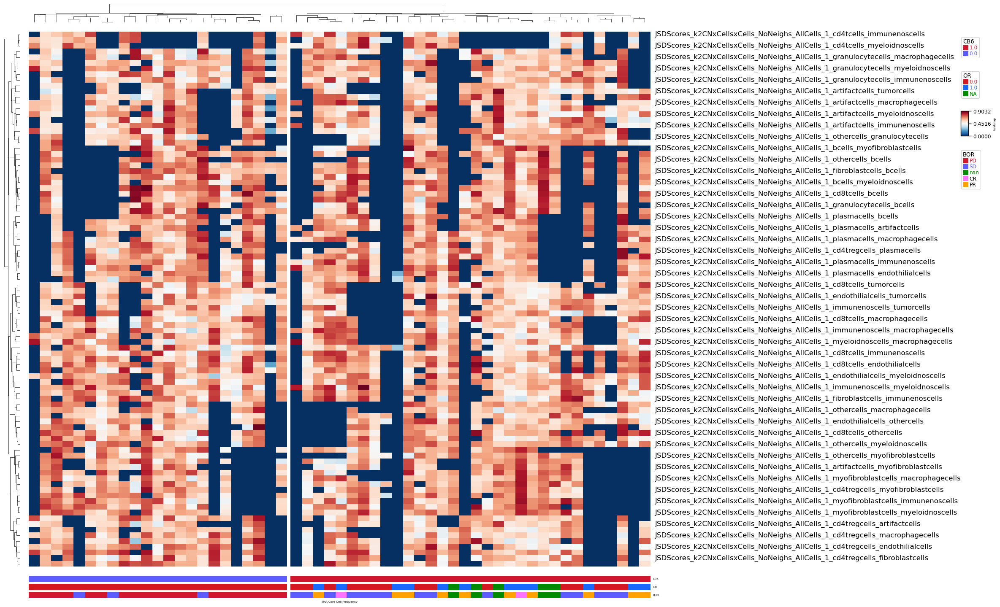

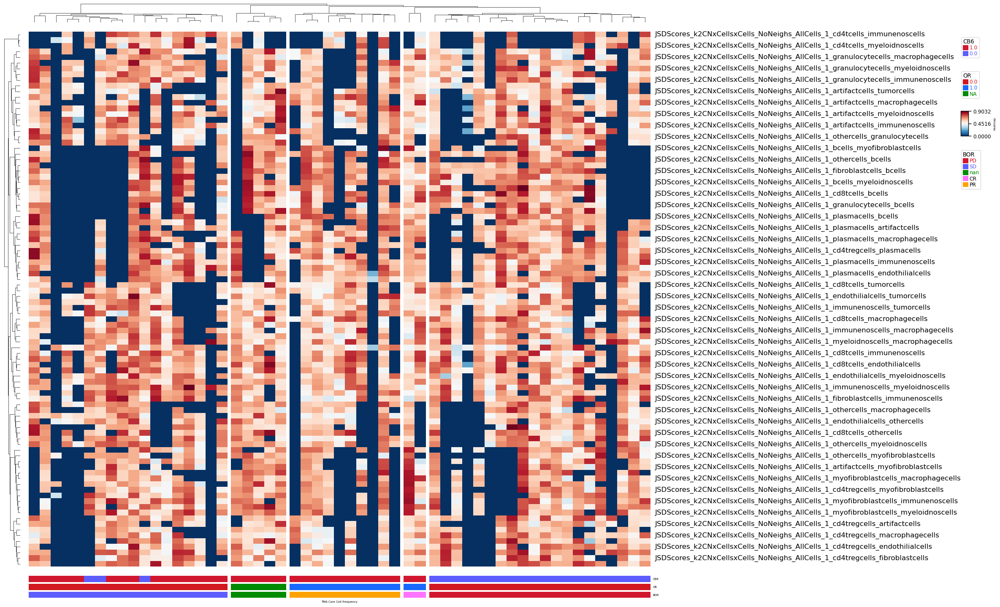

In [113]:
helper = ObsHelper(filterAData(adata), "patientid")

#create metadata
CB6 = helper.get_metadata_df('CB6').fillna('NA').astype(str)
OR = helper.get_metadata_df('OR').fillna('NA').astype(str)
BOR = helper.get_metadata_df('BOR').astype(str).fillna('NA').astype(str)
PFS = helper.get_metadata_df('pfs.E').fillna('NA').astype(str)
OS = helper.get_metadata_df('os.E').fillna('NA').astype(str)

tempdf = filterAData(adata).obs.groupby(by='patientid').mean(numeric_only=True)

which = tempdf.value_counts()
top_annot = pch.HeatmapAnnotation(
    Total_Metabolic_Markers=pch.anno_barplot(tempdf['pfs.12months'], legend=True),
)

# CB6 colormap
pal_length = len(CB6.index)
ct_cols = set(CB6.CB6)
cb6_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

#OR colormap
pal_length = len(OR.index)
ct_cols = set(OR.OR)
or_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=64)))

# BOR colormap
pal_length = len(BOR.index)
ct_cols = set(BOR.BOR)
bor_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

row_kwargs = {
    "CB6": pch.anno_simple(CB6.fillna('NA').astype(str), colors=cb6_cols, height=4), # height of the bar
    "OR":  pch.anno_simple(OR.astype(str).fillna('NA'),  colors=or_cols,  height=4), # height of the bar
    "BOR": pch.anno_simple(BOR.astype(str).fillna('NA').astype(str), colors=bor_cols, height=4), # height of the bar
} # height of the bar

metadata_annotation = pch.HeatmapAnnotation(
    axis=1, wgap=1, hgap=1, **row_kwargs)


what = dfFullValues.set_index('patientid').loc[:,  ~dfFullValues.set_index('patientid').columns.duplicated() & \
        dfFullValues.set_index('patientid').columns.str.contains('JSDScores_k2CNxCellsxCells') & \
        dfFullValues.set_index('patientid').columns.str.contains('_1_')] \
    .replace(np.inf, 1.0).replace(-np.inf, 1.0).fillna(1.0)
what.index = what.index.astype(int).astype('category')
what = what.loc[:,(what.median(0) < 0.99) & (what.median(0) > 0.01)]

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    what.T, # transpoe with .T So columns are cores
    cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=CB6,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,    
    #top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
#plt.savefig('clustermap_jsdfeatures_CNs_CB6.svg')

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    what.T,
    cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=BOR,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,
    #top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
#plt.savefig('clustermap_jsdfeatures_CNs_BOR.svg')

/tmp/ipykernel_405737/3979568531.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tempdf = filterAData(adata).obs.groupby(by='patientid').mean(numeric_only=True)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/utils.py:131: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap1 = matplotlib.cm.get_cmap(cmap).copy()


Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 9.053666666666668 mm
Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:1836: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  col_clusters = self.col_split.groupby(cols).apply(
/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:835: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/akilgall/miniconda3/envs/analysis/lib/

Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 9.053666666666668 mm


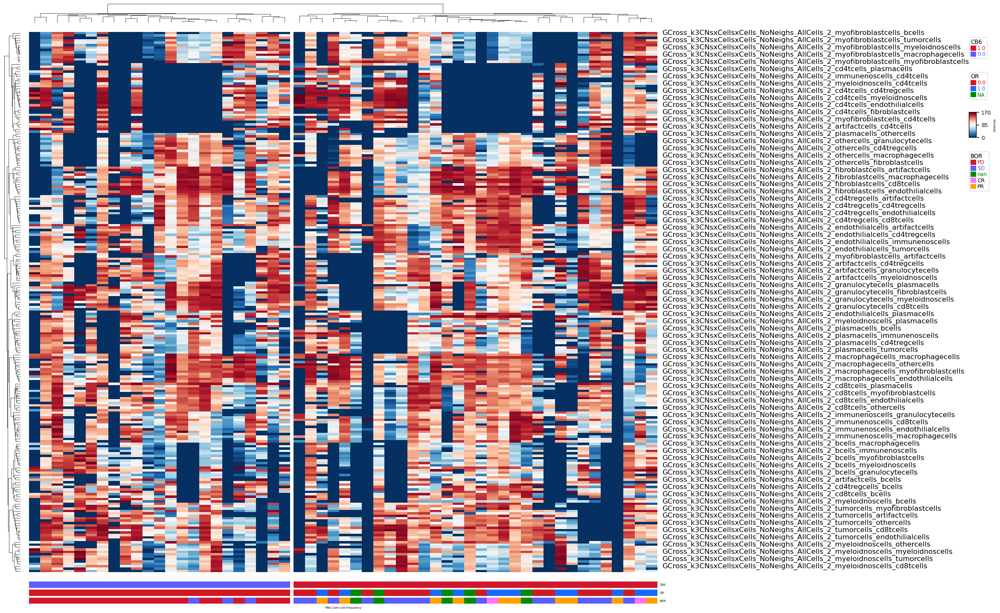

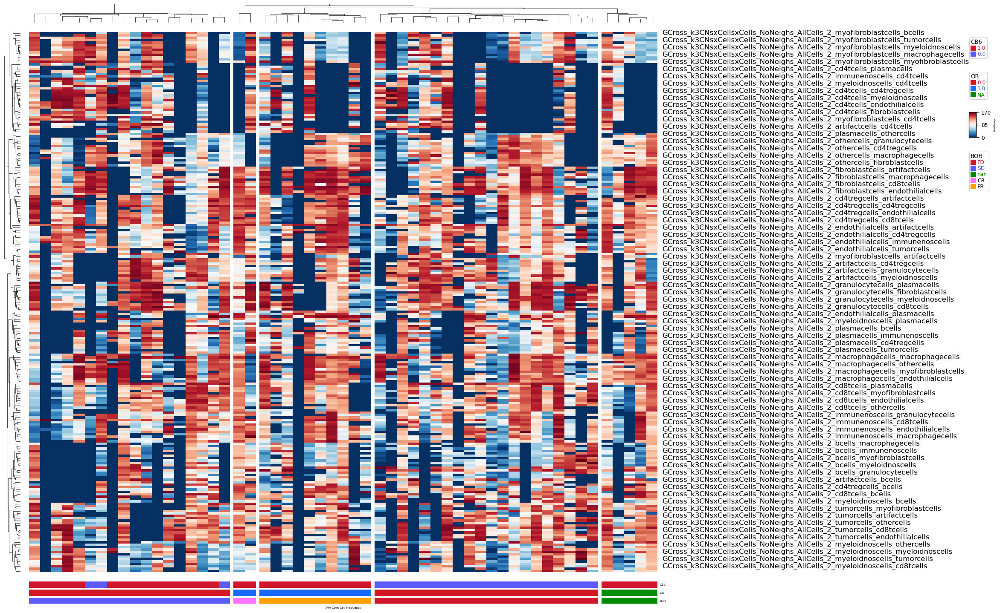

In [89]:
helper = ObsHelper(filterAData(adata), "patientid")

#create metadata
CB6 = helper.get_metadata_df('CB6').fillna('NA').astype(str)
OR = helper.get_metadata_df('OR').fillna('NA').astype(str)
BOR = helper.get_metadata_df('BOR').astype(str).fillna('NA').astype(str)
PFS = helper.get_metadata_df('pfs.E').fillna('NA').astype(str)
OS = helper.get_metadata_df('os.E').fillna('NA').astype(str)

tempdf = filterAData(adata).obs.groupby(by='patientid').mean(numeric_only=True)

which = tempdf.value_counts()
top_annot = pch.HeatmapAnnotation(
    Total_Metabolic_Markers=pch.anno_barplot(tempdf['pfs.12months'], legend=True),
)

# CB6 colormap
pal_length = len(CB6.index)
ct_cols = set(CB6.CB6)
cb6_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

#OR colormap
pal_length = len(OR.index)
ct_cols = set(OR.OR)
or_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=64)))

# BOR colormap
pal_length = len(BOR.index)
ct_cols = set(BOR.BOR)
bor_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

row_kwargs = {
    "CB6": pch.anno_simple(CB6.fillna('NA').astype(str), colors=cb6_cols, height=4), # height of the bar
    "OR":  pch.anno_simple(OR.astype(str).fillna('NA'),  colors=or_cols,  height=4), # height of the bar
    "BOR": pch.anno_simple(BOR.astype(str).fillna('NA').astype(str), colors=bor_cols, height=4), # height of the bar
} # height of the bar

metadata_annotation = pch.HeatmapAnnotation(
    axis=1, wgap=1, hgap=1, **row_kwargs)


what = dfFullValues.set_index('patientid').loc[:,  ~dfFullValues.set_index('patientid').columns.duplicated() & \
        dfFullValues.set_index('patientid').columns.str.contains('GCross_k3CNsxCellsxCells_NoNeighs_AllCells_2_')] \
    .replace(np.inf, 0.0).replace(-np.inf, 0.0).fillna(0.0)
what.index = what.index.astype(int).astype('category')
what = what.loc[:,what.mean(0) > 1e-4]

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    what.T, # transpoe with .T So columns are cores
    cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=CB6,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,    
    #top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
#plt.savefig('clustermap_gcrossfeatures_CNs_CB6.svg')

plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    what.T,
    cmap='RdBu_r',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=BOR,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,
    #top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)
#plt.savefig('clustermap_gcrossfeatures_CNs_BOR.svg')

# Combine with SMI Metric

In [90]:
sci_interations_CNs = adata.uns["scimap_interaction_results_CNs"].T
sci_interations_CNs.index = sci_interations_CNs.index.astype(str)
sci_interations_CNs['patientid'] = sci_interations_CNs.index

sci_interations_MBNs = adata.uns["scimap_interaction_results_MBNs"].T
sci_interations_MBNs.index = sci_interations_MBNs.index.astype(str)
sci_interations_MBNs['patientid'] = sci_interations_MBNs.index

dfFullValues = pd.merge(dfFullValues, sci_interations_CNs, how='left', left_on='patientid', right_on='patientid')
dfFullValues = pd.merge(dfFullValues, sci_interations_MBNs, how='left', left_on='patientid', right_on='patientid')

# Combine with Cell Ratio Proportions

In [92]:
adata

AnnData object with n_obs × n_vars = 135264 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfractions_Metabo

In [93]:
adata.uns['ratio_proportions']['nbproportions'].keys()

dict_keys(['nb_tumournontumour_20_3:Immune_func', 'nb_tumournontumour_20_3:Immune_meta', 'nb_tumournontumour_20_3:tumour_meta', 'nb_tumournontumour_20_3:tumour_func', 'nb_tumournontumour_20_3:celltypes', 'nb_tumournontumour_20_3:cell_types_immune_metapath', 'nb_tumournontumour_50_2:Immune_func', 'nb_tumournontumour_50_2:Immune_meta', 'nb_tumournontumour_50_2:tumour_meta', 'nb_tumournontumour_50_2:tumour_func', 'nb_tumournontumour_50_2:celltypes', 'nb_tumournontumour_50_2:cell_types_immune_metapath', 'MetaPathNeighbourhood:Immune_func', 'MetaPathNeighbourhood:Immune_meta', 'MetaPathNeighbourhood:tumour_meta', 'MetaPathNeighbourhood:tumour_func', 'MetaPathNeighbourhood:celltypes', 'MetaPathNeighbourhood:cell_types_immune_metapath'])

In [94]:
adata.uns['ratio_proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']

,endothilialcells:Stroma_endothilialcells:Tumour,endothilialcells:Stroma_endothilialcells:Tumour_Stroma_interface,endothilialcells:Stroma_cd4tregcells:Stroma,endothilialcells:Stroma_cd4tregcells:Tumour,endothilialcells:Stroma_cd4tregcells:Tumour_Stroma_interface,endothilialcells:Stroma_plasmacells:Stroma,endothilialcells:Stroma_plasmacells:Tumour,endothilialcells:Stroma_plasmacells:Tumour_Stroma_interface,endothilialcells:Stroma_fibroblastcells:Stroma,endothilialcells:Stroma_fibroblastcells:Tumour,...,othercells:Tumour_Stroma_interface_immunenoscells:Tumour,othercells:Tumour_Stroma_interface_immunenoscells:Tumour_Stroma_interface,othercells:Tumour_Stroma_interface_cd4tcells:Stroma,othercells:Tumour_Stroma_interface_cd4tcells:Tumour,othercells:Tumour_Stroma_interface_cd4tcells:Tumour_Stroma_interface,othercells:Tumour_Stroma_interface_bcells:Stroma,othercells:Tumour_Stroma_interface_bcells:Tumour,othercells:Tumour_Stroma_interface_bcells:Tumour_Stroma_interface,othercells:Tumour_Stroma_interface_othercells:Stroma,othercells:Tumour_Stroma_interface_othercells:Tumour
patientid,,,,,,,,,,,,,,,,,,,,,
3892,63.607656,1.881818,23.000000,0.000000,12.545455,7.666667,0.000000,18.818182,0.766667,21.202552,...,0.000000,1.166667,0.137993,5.915205,0.170732,4.277778,0.000000,3.500000,0.285185,3.226475
22193,0.000000,10.169231,0.000000,38.892308,9.039316,1.000000,0.000000,0.000000,2.666667,9.723077,...,28.444781,4.576923,5.850983,11.377912,29.750000,0.000000,18.963187,9.153846,1.170197,2.994187
22333,13.619942,1.198228,1.054054,13.619942,2.119942,0.709091,0.000000,9.186416,0.604651,13.619942,...,13.343558,1.000000,0.069979,0.580155,0.089109,0.471711,0.000000,0.333333,0.796012,0.889571
24490,2.666387,1.034267,1.461538,0.000000,2.659544,1.187500,15.998319,3.102801,0.195876,7.999160,...,0.000000,0.500000,0.040286,2.578045,0.125000,0.218696,0.000000,3.000000,0.235519,0.322256
28757,3.773626,0.397235,6.000000,0.000000,0.000000,0.000000,0.000000,12.314286,6.000000,49.057143,...,0.000000,0.000000,0.696056,19.918794,0.769231,2.436195,0.000000,0.000000,2.436195,1.475466
29937,0.000000,4.046258,1.285714,2.666320,1.618503,0.441176,0.000000,2.697505,0.314685,0.000000,...,0.000000,0.360000,0.167940,0.296532,0.272727,1.087962,0.741329,1.000000,0.284354,0.000000
31267,0.000000,5.939655,2.454545,11.586207,9.503448,0.317647,0.000000,1.250454,1.521127,0.000000,...,1.341074,0.333333,0.112114,0.670537,0.261905,1.315866,0.000000,5.500000,0.531946,0.670537
31565,0.000000,1.241373,10.166667,0.000000,18.620590,61.000000,0.000000,55.861771,0.299020,0.889309,...,0.000000,6.500000,0.935050,4.553066,2.234375,4.003931,0.000000,23.833333,1.312213,0.000000
31584,6.209544,0.983887,3.727273,0.000000,19.677732,6.833333,0.000000,19.677732,0.719298,6.209544,...,0.000000,4.428571,1.041787,4.891210,7.750000,0.000000,0.000000,0.000000,0.538256,4.891210


In [95]:
nb_temp1 = adata.uns['ratio_proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']
nb_temp1.index = nb_temp1.index.astype(str)
nb_temp1['patientid'] = nb_temp1.index
nb_temp1 = nb_temp1.reset_index(drop=True)
nb_temp1.columns = ['nratiob:' + a if a != 'patientid' else a for a in nb_temp1.columns]

nb_temp2 = adata.uns['ratio_proportions']['nbproportions']['nb_tumournontumour_20_3:tumour_meta']
nb_temp2.index = nb_temp2.index.astype(str)
nb_temp2['patientid'] = nb_temp2.index
nb_temp2 = nb_temp2.reset_index(drop=True)
nb_temp2.columns = ['nratiob:' + a if a != 'patientid' else a for a in nb_temp2.columns]

nb_temp3 = adata.uns['ratio_proportions']['nbproportions']['MetaPathNeighbourhood:celltypes']
nb_temp3.index = nb_temp3.index.astype(str)
nb_temp3['patientid'] = nb_temp3.index
nb_temp3 = nb_temp3.reset_index(drop=True)
nb_temp3.columns = ['nratiob:' + a if a != 'patientid' else a for a in nb_temp3.columns]


dfFullValues = pd.merge(dfFullValues, nb_temp1, how='left', left_on='patientid', right_on='patientid')
dfFullValues = pd.merge(dfFullValues, nb_temp2, how='left', left_on='patientid', right_on='patientid')
dfFullValues = pd.merge(dfFullValues, nb_temp3, how='left', left_on='patientid', right_on='patientid')

In [96]:
dfFullValues

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,nratiob:othercells:Minimal_Metabolic_Activity_cd4tcells:Low_Metabolic_Activity,nratiob:othercells:Minimal_Metabolic_Activity_cd4tcells:Medium_And_Regulatory_Activity,nratiob:othercells:Minimal_Metabolic_Activity_cd4tcells:Minimal_Metabolic_Activity,nratiob:othercells:Minimal_Metabolic_Activity_bcells:High_Metabolic_Activity,nratiob:othercells:Minimal_Metabolic_Activity_bcells:Low_Metabolic_Activity,nratiob:othercells:Minimal_Metabolic_Activity_bcells:Medium_And_Regulatory_Activity,nratiob:othercells:Minimal_Metabolic_Activity_bcells:Minimal_Metabolic_Activity,nratiob:othercells:Minimal_Metabolic_Activity_othercells:High_Metabolic_Activity,nratiob:othercells:Minimal_Metabolic_Activity_othercells:Low_Metabolic_Activity,nratiob:othercells:Minimal_Metabolic_Activity_othercells:Medium_And_Regulatory_Activity
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,37.395985,7.226277,14.142857,0.000000,14.958394,7.226277,11.000000,0.000000,1.662044,3.613139
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.119888,0.251892,0.081340,0.000000,0.375648,1.057948,0.557377,0.973619,0.626080,0.661218
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,0.880637,0.000000,0.244898,0.000000,0.000000,0.000000,1.600000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,4.835285,0.904762,0.000000,0.000000,0.000000,9.500000,0.000000,0.596776,1.611762
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.701665,0.644872,0.569620,0.000000,3.087326,2.257053,3.333333,0.000000,2.205233,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.372463,1.023135,0.226667,0.000000,3.631512,7.161948,3.187500,0.000000,1.320550,1.790487
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,0.893054,4.824242,2.369048,0.000000,5.179713,0.000000,9.950000,0.000000,2.232635,2.894545
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,4.307115,0.000000,2.782609,0.000000,0.000000,0.000000,0.000000,0.000000,2.411984,3.132720
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,1.103720,1.176152,1.750000,0.000000,0.000000,0.000000,14.000000,1.039911,1.702882,2.117073
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.591333,3.908006,1.590909,0.000000,0.000000,3.908006,0.000000,0.000000,5.026334,3.908006


In [97]:
tempdf = adata.uns['ratio_proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']
helper = ObsHelper(adata, "patientid")

#create metadata
CB6 = helper.get_metadata_df('CB6').fillna('NA').astype(str)
OR = helper.get_metadata_df('OR').fillna('NA').astype(str)
BOR = helper.get_metadata_df('BOR').astype(str).fillna('NA').astype(str)
PFS = helper.get_metadata_df('pfs.E').fillna('NA').astype(str)
OS = helper.get_metadata_df('os.E').fillna('NA').astype(str)

tempdf = adata.obs.groupby(by='patientid').mean(numeric_only=True)

which = tempdf.value_counts()
top_annot = pch.HeatmapAnnotation(
    Total_Metabolic_Markers=pch.anno_barplot(tempdf[['Glycolysis', 'TCACyle',
       'Regulatory', 'AminoAcidUptake', 'FatOxidation']], legend=True),
    #Max_Metabolic_Markers =pch.anno_barplot(tempdf.max(1), legend=True),
    #ColorMax_Metabolic_Markers =pch.anno_barplot(pd.DataFrame([a.mean(numeric_only=True).sort_values(ascending=False).index[0] for _, a in adata.obs.groupby(by='patientid')[additional_cols]], columns=['Max'], index=tempdf.index).astype('category')['Max'].cat.codes, cmap='tab20', legend=True),
)

# CB6 colormap
pal_length = len(CB6.index)
ct_cols = set(CB6.CB6)
cb6_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

#OR colormap
pal_length = len(OR.index)
ct_cols = set(OR.OR)
or_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=64)))

# BOR colormap
pal_length = len(BOR.index)
ct_cols = set(BOR.BOR)
bor_cols = dict(zip(ct_cols, glasbey.create_palette(palette_size=pal_length, grid_size=12)))

row_kwargs = {
    "CB6": pch.anno_simple(CB6.fillna('NA').astype(str), colors=cb6_cols, height=4), # height of the bar
    "OR":  pch.anno_simple(OR.astype(str).fillna('NA'),  colors=or_cols,  height=4), # height of the bar
    "BOR": pch.anno_simple(BOR.astype(str).fillna('NA').astype(str), colors=bor_cols, height=4), # height of the bar
} # height of the bar


metadata_annotation = pch.HeatmapAnnotation(
    axis=1, wgap=1, hgap=1, **row_kwargs)


'''plt.figure(figsize=(20, 16,))
pch.ClusterMapPlotter(
    tempdf.T, # transpoe with .T So columns are cores
    cmap='coolwarm',#custom_bwr, # 0 to 1 colormap
    #vmin=-3,
    show_rownames=True,
    show_colnames=True,
    legend=True,
    yticklabels_kws=dict(labelsize=12),
    col_cluster=True, # Call once
    col_dendrogram=True,
    row_cluster=True,
    row_dendrogram=True,
    plot=True,
    col_split=CB6,
    col_split_gap=2,
    subplot_gap=5,
    bottom_annotation=metadata_annotation,    
    top_annotation=top_annot,
    xlabel = 'TMA Core Cell Frequency',
)'''

/tmp/ipykernel_405737/1979826153.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tempdf = adata.obs.groupby(by='patientid').mean(numeric_only=True)


"plt.figure(figsize=(20, 16,))\npch.ClusterMapPlotter(\n    tempdf.T, # transpoe with .T So columns are cores\n    cmap='coolwarm',#custom_bwr, # 0 to 1 colormap\n    #vmin=-3,\n    show_rownames=True,\n    show_colnames=True,\n    legend=True,\n    yticklabels_kws=dict(labelsize=12),\n    col_cluster=True, # Call once\n    col_dendrogram=True,\n    row_cluster=True,\n    row_dendrogram=True,\n    plot=True,\n    col_split=CB6,\n    col_split_gap=2,\n    subplot_gap=5,\n    bottom_annotation=metadata_annotation,    \n    top_annotation=top_annot,\n    xlabel = 'TMA Core Cell Frequency',\n)"

## Compute Mann-Whitney P-values In Case We Want to Use Those for STABL Modeling, etc.

In [98]:
def runmannwhitney(data, colstoinclude, condcol, condval):
    df = data.copy()
    cols = [col for col in colstoinclude if col != condcol]
    cond = df[condcol].astype(float).astype(int) == condval
    df = df.drop(condcol, axis=1)

    neg_outcome = df.loc[cond, cols]
    print("neg.shape: ", neg_outcome.shape)
    pos_outcome = df.loc[~cond, cols]
    print("pos.shape: ", pos_outcome.shape)

    #mean_neg_outcome = neg_outcome.mean(axis=0).astype(np.float32) # Mean for each feature
    #mean_pos_outcome = pos_outcome.mean(axis=0).astype(np.float32)
    with np.errstate(divide='ignore'):
        log2fc_pn = pos_outcome.mean(axis=0).astype(np.float32).apply(np.log2) - neg_outcome.mean(axis=0).astype(np.float32).apply(np.log2) # Log2(mean in pos / mean in neg)

    results = []
    stat, p = mannwhitneyu(neg_outcome, pos_outcome)
    for i, col in enumerate(cols):
        print(col, end="/r")
        results.append([col, stat[i], p[i]])

    results_df = pd.DataFrame(results, columns=['metric', 'Mann_Whitney U', 'p_value'])
    null_hypothesis, adjusted_pvalues, a_sidak, a_bonferonni = sm.stats.multipletests(results_df['p_value'], method = "holm")
    results_df['-log10'] = 1/np.log10(results_df['p_value'])
    results_df['adj_p'] = adjusted_pvalues
    results_df["log2FC"] = pd.DataFrame(log2fc_pn.values)
    return results_df.sort_values('p_value')

In [99]:
dfFullValues = dfFullValues.fillna(0.0)

features = dfFullValues.drop(['patientid', 'BOR', 'OR', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months'], axis=1).copy()

mannwhitneyresults = runmannwhitney(features, features.columns, 'CB6', 1)
#.sort_values(by = 'p_value')

/tmp/ipykernel_405737/1967584568.py:1: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  dfFullValues = dfFullValues.fillna(0.0)


neg.shape:  (32, 2175153)
pos.shape:  (23, 2175153)


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [114]:
mannwhitneyresults

,metric,Mann_Whitney U,p_value,-log10,adj_p,log2FC,GCross,JSD,nb,smi,...,cd4tregcells,cd4tcells,granulocytecells,endothilialcells,myofibroblastcells,myeloidnoscells,celltypes,k2,k3,MB
108690,GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_Al...,551.0,0.000437,-0.297666,1.0,-3.239983,True,False,False,False,...,False,False,False,True,False,False,plasmacells,False,True,False
99601,GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_Al...,551.5,0.000646,-0.313529,1.0,-2.034170,True,False,False,False,...,False,False,False,True,False,False,tumorcells,True,False,False
100132,GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_Al...,234.0,0.000707,-0.317413,1.0,5.015486,True,False,False,False,...,False,True,False,False,False,False,tumorcells,True,False,False
2594,GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_Al...,544.0,0.000950,-0.330898,1.0,-2.236603,True,False,False,False,...,False,False,False,True,False,False,plasmacells,True,False,False
258366,GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_Al...,520.0,0.000984,-0.332539,1.0,-8.065450,True,False,False,False,...,False,False,False,False,True,False,fibroblastcells,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515,GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_Al...,368.5,1.000000,inf,1.0,-1.434709,True,False,False,False,...,True,False,False,False,False,False,macrophagecells,True,False,False
495,GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_Al...,368.0,1.000000,inf,1.0,NaN,True,False,False,False,...,True,False,False,False,False,False,macrophagecells,True,False,False
447,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_1_m...,368.0,1.000000,inf,1.0,0.087713,True,False,False,False,...,False,False,False,False,False,False,macrophagecells,True,False,False
304,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_1_o...,368.0,1.000000,inf,1.0,0.026045,True,False,False,False,...,False,False,False,False,False,False,othercells,True,False,False


In [101]:
#mannwhitneyresults = pd.concat(mannwhitneyresults.values(), ignore_index=False).sort_values(by = 'p_value')

<Axes: >

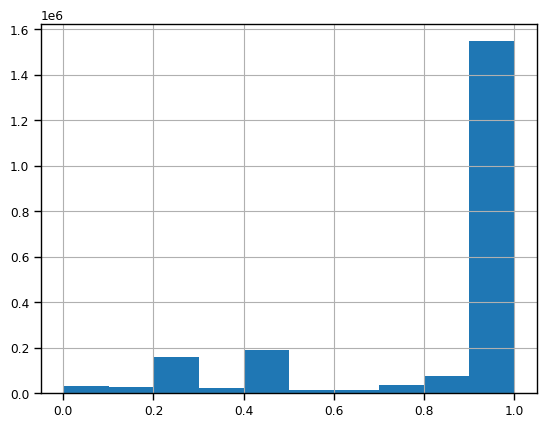

In [102]:
mannwhitneyresults.p_value.hist()

<Axes: >

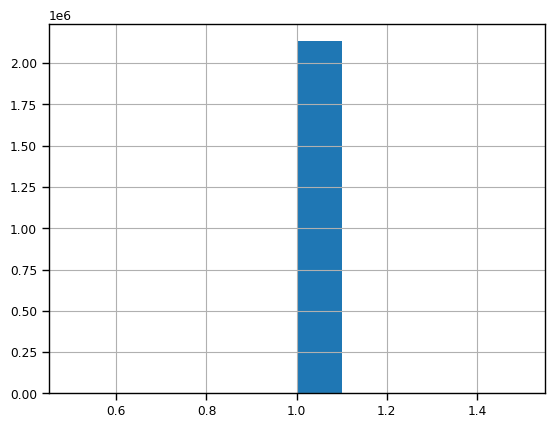

In [103]:
mannwhitneyresults.adj_p.hist()

In [104]:
list(mannwhitneyresults.head(20)['metric'])

['GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_AllCells_2_plasmacells_endothilialcells_IDO1',
 'GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_AllCells_1_endothilialcells_IDO1_tumorcells_HLAA',
 'GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_AllCells_0_cd4tcells_tumorcells_ATPA5_ATPA5high_CITRATESYNTHASE_CITRATESYNTHASEhigh_G6PD_G6PDhigh_GLUT1_GLUT1high_IDH2_IDH2high_NAKATPASE',
 'GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_AllCells_1_plasmacells_endothilialcells_IDO1',
 'GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_AllCells_1_myofibroblastcells_ATPA5_ATPA5high_IDH2_IDH2high_tumorcells_ATPA5_ATPA5high_CITRATESYNTHASE_CITRATESYNTHASEhigh_GLUT1_GLUT1high_IDH2_IDH2high_NAKATPASE_SDHA',
 'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_AllCells_2_macrophagecells_IDO1_macrophagecells_Granzymeb',
 'GCross_MPCNsxImmunefuncxImmunefunc_NoNeighs_AllCells_2_macrophagecells_Granzymeb_macrophagecells_IDO1',
 'GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_AllCells_1_cd4tcells_ATPA5_ATPA5high_CITRATESYNTHASE_CITR

## Write to File

In [105]:
dfFullValues.OR = dfFullValues.OR.astype(str)
dfFullValues.CB6 = dfFullValues.CB6.astype(str)
dfFullValues.PORvsFPD = dfFullValues.PORvsFPD.astype(str)
dfFullValues['pfs.T'] = dfFullValues['pfs.T'].astype(np.float32)

In [106]:
dfFullValues['pfs.E'] = dfFullValues['pfs.E'].astype(np.float32)
dfFullValues['os.T'] = dfFullValues['os.T'].astype(np.float32)
dfFullValues['os.E'] = dfFullValues['os.E'].astype(np.float32)
dfFullValues['pfs.6months'] = dfFullValues['pfs.6months'].astype(str)
dfFullValues['pfs.12months'] = dfFullValues['pfs.12months'].astype(str)
dfFullValues['OS.18months'] = dfFullValues['OS.18months'].astype(str)
dfFullValues['OS.24months'] = dfFullValues['OS.24months'].astype(str)

In [102]:
dfFullValues.to_csv(r'AnnDataFiles/4-output_nsclc_ytma_modelingfeatures.csv')
#dfFullValues.to_hdf(r'AnnDataFiles/4-output_nsclc_ytma_modelingfeatures.h5', 'test', format='t')

In [105]:
mannwhitneyresults.to_csv(r'AnnDataFiles/4-output_nsclc_ytma_mannwhitneyresults.csv')

# Plot MannWhitney Results

In [107]:
import re
import pandas as pd

def annotate_substrings(df, column, substrings, new_column='contains_substring'):
    """
    Annotates a DataFrame with a new boolean column indicating whether any of the
    provided substrings are present in the specified column.

    Parameters:
    - df: pd.DataFrame - the DataFrame to process.
    - column: str - the column name in which to search for substrings.
    - substrings: list of str - list of substrings to search for.
    - new_column: str - the name of the new column to add (default 'contains_substring').

    Returns:
    - pd.DataFrame: The DataFrame with the new boolean column added.
    """
    # Create a regular expression that matches any of the substrings.
    regex = '|'.join(map(re.escape, substrings))
    #print(regex)
    
    # Use .str.contains to create a boolean series. Set case=False for case-insensitive matching.
    df[new_column] = df[column].str.contains(regex, case=False, na=False)
    return df

In [108]:
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['GCross'], new_column='GCross')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['JSD'], new_column='JSD')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['nb'], new_column='nb')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['smi'], new_column='smi')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['nratiob'], new_column='nratiob')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['_0_'], new_column='_0_')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['_1_'], new_column='_1_')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['_2_'], new_column='_2_')

mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['Minimal'], new_column='MinimalMBN')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['Low'], new_column='LowMBN')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['Medium'], new_column='MediumMBN')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['High'], new_column='HighMBN')

mannwhitneyresults['metrictype'] = mannwhitneyresults[['GCross', 'JSD', 'nb', 'smi', 'nratiob']].idxmax(axis=1)

vals = np.array([False for _ in range(len(mannwhitneyresults['nratiob']))])
for ct in [
 'othercells',
 'macrophagecells',
 'cd8tcells',
 'fibroblastcells',
 'tumorcells',
 'immunenoscells',
 'plasmacells',
 'bcells',
 'cd4tregcells',
 'cd4tcells',
 'granulocytecells',
 'endothilialcells',
 'myofibroblastcells',
 'myeloidnoscells']:
    mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', [ct], new_column=ct)
    vals = vals | mannwhitneyresults[ct]
mannwhitneyresults['celltypes'] = mannwhitneyresults[['othercells', 'macrophagecells', 'cd8tcells', 'fibroblastcells', 'tumorcells', 'immunenoscells', 'plasmacells', 'bcells', 'cd4tregcells', 'cd4tcells', 'granulocytecells', 'endothilialcells', 'myofibroblastcells', 'myeloidnoscells']].idxmax(axis=1)

In [109]:
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['k2'], new_column='k2')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['k3'], new_column='k3')
mannwhitneyresults = annotate_substrings(mannwhitneyresults, 'metric', ['MBN', 'Metabolic'], new_column='MB')

In [110]:
pvalcutoff = 0.005
mannwhitneyresults[mannwhitneyresults['p_value'] < pvalcutoff]

,metric,Mann_Whitney U,p_value,-log10,adj_p,log2FC,GCross,JSD,nb,smi,...,cd4tregcells,cd4tcells,granulocytecells,endothilialcells,myofibroblastcells,myeloidnoscells,celltypes,k2,k3,MB
108690,GCross_k3CNsxImmunefuncxImmunefunc_NoNeighs_Al...,551.0,0.000437,-0.297666,1.0,-3.239983,True,False,False,False,...,False,False,False,True,False,False,plasmacells,False,True,False
99601,GCross_k2CNsxImmunefuncxTumourfunc_NoNeighs_Al...,551.5,0.000646,-0.313529,1.0,-2.034170,True,False,False,False,...,False,False,False,True,False,False,tumorcells,True,False,False
100132,GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_Al...,234.0,0.000707,-0.317413,1.0,5.015486,True,False,False,False,...,False,True,False,False,False,False,tumorcells,True,False,False
2594,GCross_k2CNsxImmunefuncxImmunefunc_NoNeighs_Al...,544.0,0.000950,-0.330898,1.0,-2.236603,True,False,False,False,...,False,False,False,True,False,False,plasmacells,True,False,False
258366,GCross_k3CNsxImmunemetaxTumourmeta_NoNeighs_Al...,520.0,0.000984,-0.332539,1.0,-8.065450,True,False,False,False,...,False,False,False,False,True,False,fibroblastcells,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095449,nbMetaPathNeighbourhood:Immune_meta_fibroblast...,266.0,0.004739,-0.430237,1.0,3.446463,False,False,True,False,...,False,False,False,False,False,False,fibroblastcells,False,False,False
3597,GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_Al...,266.0,0.004739,-0.430237,1.0,4.071379,True,False,False,False,...,False,True,False,False,False,False,cd4tcells,True,False,False
3374,GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_Al...,266.0,0.004739,-0.430237,1.0,4.455146,True,False,False,False,...,False,True,False,False,False,False,macrophagecells,True,False,False
253929,GCross_k3CNsxImmunefuncxTumourfunc_NoNeighs_Al...,495.0,0.004801,-0.431279,1.0,-2.439319,True,False,False,False,...,False,False,False,True,False,False,tumorcells,False,True,False


In [111]:
def revert(a):
    if 'GCross_k2' in a:
        if "Edge" in a:
            return 'GCrossEdge'
        return 'GCross_k2'
    elif 'GCross_k3' in a:
        if "Edge" in a:
            return 'GCrossEdge'
        return 'GCross_k3'
    elif 'JSDScores_k2' in a:
        return 'JSDScores_k2'
    elif 'JSDScores_k3' in a:
        return 'JSDScores_k3'
    elif 'JSDScores_MP' in a:
        return 'JSDScores_MP'
    elif 'GCross_MP' in a:
        if "Edge" in a:
            return 'GCrossEdge'
        return 'GCross_MP'
    elif 'MetaG' in a:
        return 'MetaG'
    elif 'nratiob' in a:
        return 'nratiob'
    elif 'nbMeta' in a:
        return 'nbMeta'
    elif 'nbnb' in a:
        return 'nbnb'

df_row = pd.DataFrame({'Category': [revert(a) for a in mannwhitneyresults[mannwhitneyresults['p_value'] < pvalcutoff].metric.values]}, index=mannwhitneyresults[mannwhitneyresults['p_value'] < pvalcutoff].metric)

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/PyComplexHeatmap/dotHeatmap.py:360: FutureWarning: The provided callable <function mean at 0x7492e02b9c60> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  data2d = data.pivot_table(


Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Inferred max_s (max size of scatter point) is: 279.37580095303724
Plotting legends..


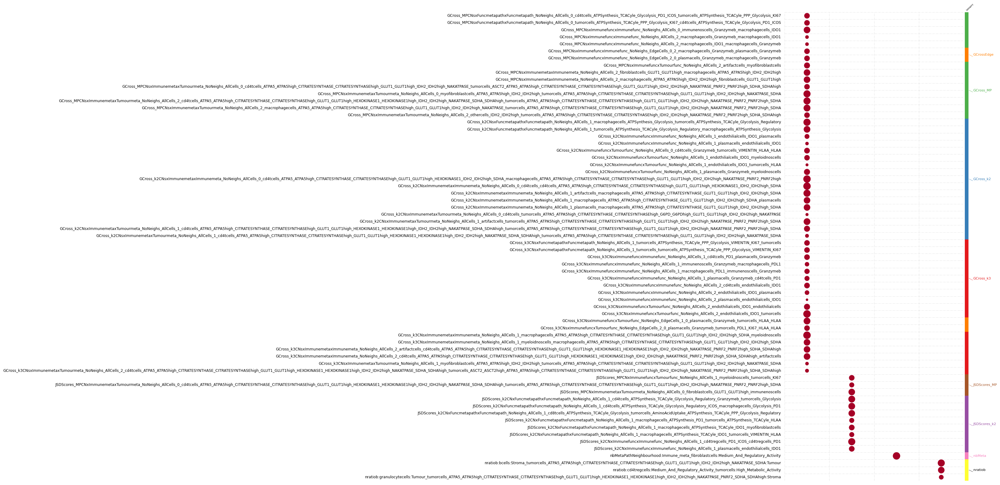

In [112]:
row_ha = pch.HeatmapAnnotation(
                           Category=pch.anno_simple(df_row.Category,cmap='Set1',
                                           add_text=False,legend=False),
                           label=pch.anno_label(df_row.Category, merge=True,rotation=0),
                           axis=0,verbose=0,label_kws={'rotation':45,'horizontalalignment':'left'})

#col_ha = HeatmapAnnotation(
#                           Dataset=anno_simple(mannwhitneyresults[mannwhitneyresults['p_value'] < 0.005].metrictype.unique,cmap='Set1',legend=False,add_text=True),
#                           Correlation=anno_simple(mannwhitneyresults[mannwhitneyresults['p_value'] < 0.005].metrictype.unique,cmap='Dark2',legend=False,add_text=True),
#                           verbose=0,label_side='left',label_kws={'horizontalalignment':'right'})

plt.figure(figsize=(8, 20))
cm = pch.DotClustermapPlotter(data=mannwhitneyresults[mannwhitneyresults['p_value'] < pvalcutoff], x='metrictype', y='metric', value='p_value', 
                          #c='p_value',
                          #s='p_value',
                          row_cluster=False,col_cluster=False,
                          cmap='RdYlGn_r',
                          #colors={'Enrich':'red','Depletion':'blue'},
                          #marker={'Enrich':'^','Depletion':'v'},
                          #top_annotation=col_ha,
                          right_annotation=row_ha,
                          col_split=row_ha,
                          #row_split=mannwhitneyresults[mannwhitneyresults['p_value'] < 0.005].metrictype, col_split_gap=0.5,row_split_gap=1,
                          show_rownames=True,show_colnames=False,row_dendrogram=False,
                          verbose=1,legend_gap=7) #if the size of dot in legend is too large, use alpha to control, for example: alpha=0.8
#plt.savefig('MannWhitneyResults.svg')

In [131]:
dfFullValues

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,nratiob:plasmacells:Minimal_Metabolic_Activity_myeloidnoscells:Low_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_myeloidnoscells:Medium_And_Regulatory_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_myeloidnoscells:Minimal_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:High_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:Low_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:Medium_And_Regulatory_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:Minimal_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_plasmacells:High_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_plasmacells:Low_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_plasmacells:Medium_And_Regulatory_Activity
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,3.021898,0.000000,1.142857,0.000000,1.007299,0.000000,0.800000,0.000000,0.000000,0.000000
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.000000,17.395611,3.733333,0.000000,9.265053,4.348903,1.142857,0.000000,18.530107,0.000000
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,0.000000,0.000000,3.000000,0.000000,0.577225,0.000000,0.538462,0.000000,1.154450,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.000000,0.000000,3.607143,0.000000,17.315577,5.063563,2.148936,0.000000,2.473654,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19.698698,0.000000,10.812500,0.000000,9.849349,0.000000,3.264151,0.000000,3.177209,48.561404
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,0.108612,0.000000,0.083333,0.000000,0.014167,0.072727,0.016949,0.000000,0.651675,0.000000
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,0.418747,0.000000,0.363636,0.000000,0.089732,0.111883,0.117647,0.000000,0.942181,0.000000
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,4.789357,3.402439,9.000000,0.668514,0.112032,0.183916,0.091837,0.000000,1.596452,2.268293
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.143610,0.111657,0.125000,0.000000,0.095740,0.000000,0.333333,0.000000,0.095740,0.000000


In [132]:
lungPrimaryids = [3892, 22193, 22333, 24490, 28757, 29937, 31257, 31267, 31565, 31584, 31590, 32054, 32340, 32343, 32350, 32372, 32749, 32761, 34668, 34670, 34672, 34673, 34678, 34680, 34686, 34687, 34688, 34689, 34692, 34693, 34694, 34695, 34697, 34698, 34699, 34700, 34703, 34704, 34706,34711, 34713, 34715, 34718, 34721, 34722, 34726, 34733, 34737, 34738, 34743, 34746, 34749, 34758, 34759, 34765, 34767]
adata[adata.obs['patientid'].isin(lungPrimaryids)]

View of AnnData object with n_obs × n_vars = 135346 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfraction

# Plot all features

In [133]:
dfFullValues

,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tregcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd8tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_plasmacells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_endothilialcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_fibroblastcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_othercells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_cd4tcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_granulocytecells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_bcells,GCross_k2CNsxCellsxCells_NoNeighs_AllCells_0_cd4tregcells_artifactcells,...,nratiob:plasmacells:Minimal_Metabolic_Activity_myeloidnoscells:Low_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_myeloidnoscells:Medium_And_Regulatory_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_myeloidnoscells:Minimal_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:High_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:Low_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:Medium_And_Regulatory_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_endothilialcells:Minimal_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_plasmacells:High_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_plasmacells:Low_Metabolic_Activity,nratiob:plasmacells:Minimal_Metabolic_Activity_plasmacells:Medium_And_Regulatory_Activity
0,142.439026,66.993607,0.000000,0.000000,43.333336,0.000000,60.000000,72.619049,36.666668,46.000000,...,3.021898,0.000000,1.142857,0.000000,1.007299,0.000000,0.800000,0.000000,0.000000,0.000000
1,98.181816,89.629631,17.777779,72.500000,0.000000,110.000000,0.000000,72.007721,110.000000,0.000000,...,0.000000,17.395611,3.733333,0.000000,9.265053,4.348903,1.142857,0.000000,18.530107,0.000000
2,134.705887,150.000000,110.000000,0.000000,134.705887,0.000000,0.000000,114.571434,59.381935,50.769234,...,0.000000,0.000000,3.000000,0.000000,0.577225,0.000000,0.538462,0.000000,1.154450,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.357143,3.355705,0.333333,...,0.000000,0.000000,3.607143,0.000000,17.315577,5.063563,2.148936,0.000000,2.473654,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19.698698,0.000000,10.812500,0.000000,9.849349,0.000000,3.264151,0.000000,3.177209,48.561404
6,140.000000,100.000000,0.000000,130.000000,150.000000,0.000000,0.000000,65.000000,152.500000,0.000000,...,0.108612,0.000000,0.083333,0.000000,0.014167,0.072727,0.016949,0.000000,0.651675,0.000000
7,117.500000,81.481483,116.666664,96.400002,81.875000,70.000000,0.000000,63.333336,0.000000,0.000000,...,0.418747,0.000000,0.363636,0.000000,0.089732,0.111883,0.117647,0.000000,0.942181,0.000000
8,73.333336,28.372093,0.000000,21.851852,45.000000,4.545455,10.000000,16.600000,19.166666,12.857142,...,4.789357,3.402439,9.000000,0.668514,0.112032,0.183916,0.091837,0.000000,1.596452,2.268293
9,119.545456,120.000000,104.210526,49.393940,0.000000,0.000000,81.935478,98.333336,0.000000,65.469536,...,0.143610,0.111657,0.125000,0.000000,0.095740,0.000000,0.333333,0.000000,0.095740,0.000000


/home/akilgall/miniconda3/envs/squidpy/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)


<Axes: >

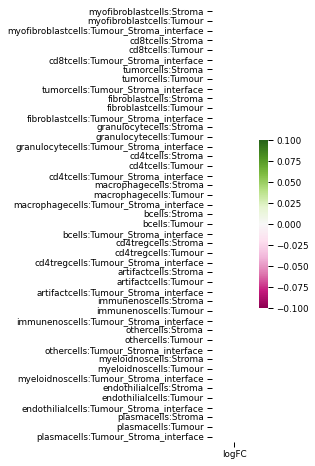

In [134]:
tempdf = adata.uns['proportions']['nbproportions']['nb_tumournontumour_20_3:celltypes']
tempdf = np.log2(tempdf + 1e-5)
plt.figure(figsize=(1,8))
sns.heatmap(pd.DataFrame({"logFC": tempdf.loc[CB6[CB6 == 1.0].dropna().index,:].mean(0) - tempdf.loc[CB6[CB6 == 0.0].dropna().index,:].mean(0)}), cmap='PiYG')

In [362]:
mannwhitneyresults = mannwhitneyresults.loc[~mannwhitneyresults['metric'].str.contains('Edge'), : \
]


In [363]:
mannwhitneyresults

,metric,Mann_Whitney U,p_value,-log10,adj_p,log2FC,GCross,JSD,nb,smi,...,_group_size,ind,lpval,_0_,_1_,_2_,MinimalMBN,LowMBN,MediumMBN,HighMBN
2101145,smi:cd8tcells:tumorcells:High_Metabolic_Activity,357.0,0.740623,-7.668541,1.0,0.418062,False,False,False,True,...,80,0.000000,0.130403,False,False,False,False,False,False,True
2100959,smi:fibroblastcells:macrophagecells:High_Metab...,352.0,0.253173,-1.676216,1.0,inf,False,False,False,True,...,80,0.301030,0.596582,False,False,False,False,False,False,True
2100953,smi:fibroblastcells:tumorcells:High_Metabolic_...,352.0,0.253173,-1.676216,1.0,inf,False,False,False,True,...,80,0.477121,0.596582,False,False,False,False,False,False,True
2101226,smi:cd8tcells:fibroblastcells:High_Metabolic_A...,357.5,0.818805,-11.518181,1.0,0.109173,False,False,False,True,...,80,0.602060,0.086819,False,False,False,False,False,False,True
2100986,smi:tumorcells:tumorcells:High_Metabolic_Activity,330.0,0.155295,-1.236333,1.0,2.157564,False,False,False,True,...,80,0.698970,0.808844,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63156,GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeigh...,386.0,0.507222,-3.392111,1.0,-0.547334,True,False,False,False,...,418008,6.206729,0.294802,False,True,False,False,False,False,False
362828,GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeigh...,368.0,1.000000,inf,1.0,NaN,True,False,False,False,...,418008,6.206730,-0.000000,False,True,False,False,False,False,False
90041,GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeigh...,391.0,0.236530,-1.597155,1.0,-inf,True,False,False,False,...,418008,6.206731,0.626113,False,True,False,False,False,False,False
104039,GCross_k2CNsxImmunemetaxTumourmeta_NoNeighs_Al...,413.5,0.233318,-1.582149,1.0,-1.061041,True,False,False,False,...,418008,6.206731,0.632052,False,True,False,False,False,False,True


In [385]:
mannwhitneyresults['region'] = mannwhitneyresults[['k2', 'k3', 'MB']].idxmax(axis=1)
mannwhitneyresults['metricregion'] = mannwhitneyresults['metrictype'] + mannwhitneyresults[['k2', 'k3', 'MB']].idxmax(axis=1)# + mannwhitneyresults[['_0_', '_1_', '_2_', 'MinimalMBN', 'LowMBN', 'MediumMBN', 'HighMBN']].idxmax(axis=1)
#np.array(['k2', 'k3', 'MB'])

In [386]:
mannwhitneyresults.groupby(by=['metrictype', 'region'])['p_value'].value_counts()

metrictype  region  p_value 
GCross      k2      1.000000    129157
                    0.417405     44333
                    0.253173     28583
                    0.236530     13907
                    0.812858      9690
                                 ...  
smi         k2      0.748977         1
                    0.764557         1
                    0.813034         1
                    0.945447         1
                    0.988246         1
Name: count, Length: 15056, dtype: int64

In [387]:
mannwhitneyresults.groupby(by=['metrictype', 'region'])['p_value'].value_counts()#.reset_index().pivot(index='metrictype', columns='region')

metrictype  region  p_value 
GCross      k2      1.000000    129157
                    0.417405     44333
                    0.253173     28583
                    0.236530     13907
                    0.812858      9690
                                 ...  
smi         k2      0.748977         1
                    0.764557         1
                    0.813034         1
                    0.945447         1
                    0.988246         1
Name: count, Length: 15056, dtype: int64

In [388]:
mannwhitneyresults

,metric,Mann_Whitney U,p_value,-log10,adj_p,log2FC,GCross,JSD,nb,smi,...,_group_size,ind,lpval,_0_,_1_,_2_,MinimalMBN,LowMBN,MediumMBN,HighMBN
2100986,smi:tumorcells:tumorcells:High_Metabolic_Activity,330.0,0.155295,-1.236333,1.0,2.157564,False,False,False,True,...,80,0.000000,0.808844,False,False,False,False,False,False,True
2101134,smi:cd4tcells:plasmacells:High_Metabolic_Activity,352.0,0.253173,-1.676216,1.0,inf,False,False,False,True,...,80,0.301030,0.596582,False,False,False,False,False,False,True
2100976,smi:othercells:immunenoscells:High_Metabolic_A...,352.0,0.253173,-1.676216,1.0,inf,False,False,False,True,...,80,0.477121,0.596582,False,False,False,False,False,False,True
2100993,smi:tumorcells:myeloidnoscells:High_Metabolic_...,352.0,0.253173,-1.676216,1.0,inf,False,False,False,True,...,80,0.602060,0.596582,False,False,False,False,False,False,True
2101129,smi:cd4tcells:cd8tcells:High_Metabolic_Activity,363.0,0.812858,-11.112918,1.0,0.495860,False,False,False,True,...,80,0.698970,0.089985,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3453,GCross_k2CNsxImmunemetaxImmunemeta_NoNeighs_Al...,386.0,0.507222,-3.392111,1.0,-1.282983,True,False,False,False,...,156154,5.790199,0.294802,True,False,False,False,False,False,True
51358,GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeigh...,368.0,1.000000,inf,1.0,NaN,True,False,False,False,...,156154,5.790199,-0.000000,True,False,False,False,False,False,False
39479,GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeigh...,352.0,0.253173,-1.676216,1.0,inf,True,False,False,False,...,156154,5.790200,0.596582,True,False,False,False,False,False,False
456135,GCross_MPCNsxImmunefuncxTumourfunc_NoNeighs_Al...,391.0,0.668370,-5.714842,1.0,-0.251777,True,False,False,False,...,156154,5.790201,0.174983,True,False,False,False,False,False,False


In [389]:
mannwhitneyresults['metricregion'].value_counts()

metricregion
GCrossk2     316866
GCrossk3     156753
JSDk2         94391
nratiobk2     28272
JSDk3         13367
nratiobMB      3330
nbk2           1588
nbMB           1191
smik2           625
smiMB           498
Name: count, dtype: int64

In [390]:
mannwhitneyresults[mannwhitneyresults['metricregion'] == 'GCrossk3_0_'].sort_values('p_value')['metric'].values

array([], dtype=object)

In [391]:
list(mannwhitneyresults['metric'].tail(20))

['GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells_0_tumorcells_ATPSynthesis_TCACyle_PPP_Glycolysis_VIMENTIN_KI67_cd4tcells_ATPSynthesis_TCACyle_Glycolysis_PD1_ICOS',
 'GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells_0_tumorcells_AminoAcidUptake_ATPSynthesis_TCACyle_FatOxidation_Glycolysis_Regulatory_HLAA_tumorcells_AminoAcidUptake_ATPSynthesis_TCACyle_Glycolysis',
 'GCross_MPCNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells_0_tumorcells_AminoAcidUptake_ATPSynthesis_TCACyle_FatOxidation_Glycolysis_Regulatory_HLAA_macrophagecells_ATPSynthesis_TCACyle_Glycolysis_PD1',
 'GCross_MPCNsxImmunemetaxImmunemeta_NoNeighs_AllCells_0_myofibroblastcells_IDH2_IDH2high_cd8tcells_ATPA5_ATPA5high_CITRATESYNTHASE_CITRATESYNTHASEhigh_GLUT1_GLUT1high_IDH2_IDH2high_NAKATPASE',
 'GCross_k2CNsxFuncmetapathxFuncmetapath_NoNeighs_AllCells_0_tumorcells_AminoAcidUptake_ATPSynthesis_TCACyle_FatOxidation_PPP_Glycolysis_Regulatory_PDL1_macrophagecells_Glycolysis_PDL1',
 'GCross_MPCNsxFuncmetapathxFun

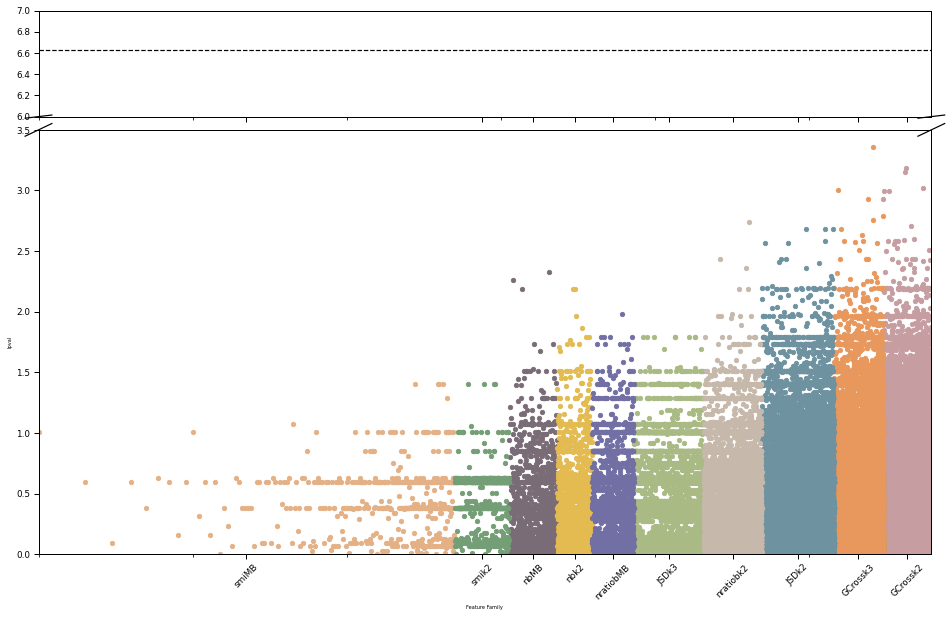

In [393]:
import matplotlib as mpl
mpl.rcParams['path.simplify'] = True

fig, (ax2, ax) = plt.subplots(2, 1, sharex=True, figsize=(16, 10), gridspec_kw={'height_ratios': [1, 4]})
fig.subplots_adjust(hspace=0.05)  # adjust space between Axes

#ax = fig.add_subplot(111)
colors = ['black', 'darkred', 'green', 'blue', 'yellow', 'magenta', 'tab:pink', 'tab:cyan', 'indigo', 'goldenrod']
colors = ['#C69EA2', '#E8985D', '#6E92A0', '#A9BA85', '#7A6C77', '#E3BB51', '#716FA3', '#C6B8AA', '#E4B085', '#749E75']
colors += colors
colors += colors
colors += colors
x_labels = []
x_labels_pos = []

mannwhitneyresults = mannwhitneyresults.sample(frac=1.0)
mannwhitneyresults['_group_size'] = mannwhitneyresults.groupby('metricregion')['metricregion'].transform('size')
mannwhitneyresults = mannwhitneyresults.sort_values('_group_size', ascending=True)
mannwhitneyresults['ind'] = np.log10(range(1, len(mannwhitneyresults)+1, 1))
mannwhitneyresults['lpval'] = -np.log10(mannwhitneyresults['p_value'])


for num, (name, group) in enumerate(mannwhitneyresults.groupby(by='metricregion')):
    group.plot(kind='scatter', x='ind', y='lpval', color=colors[num % len(mannwhitneyresults.groupby(by='metricregion'))], ax=ax, rasterized=True)
    x_labels.append(name)
    x_labels_pos.append((group['ind'].max() - (group['ind'].max() - group['ind'].min())/2.0))
ax.set_xticks(x_labels_pos)
ax.set_xticklabels(x_labels)
#ax.set_xscale('log')
ax.set_xlim([min(mannwhitneyresults['ind']), max(mannwhitneyresults['ind'])])#, np.log10(len(mannwhitneyresults))])
ax.set_ylim([0.0, 7.0])
ax.set_xlabel('Feature Family')
plt.xticks(rotation=45)
ax2.axhline(y=-np.log10(0.5 / 2132954.0), color='k', linestyle='--')

d = .015  # how big to make the diagonal lines in axes coordinates
# arguments to pass plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((-d, +d), (1-d, 1+d), **kwargs)
ax.plot((1-d, 1+d), (1-d, 1+d), **kwargs)

kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((1-d, 1+d), (-d, +d), **kwargs)
ax2.plot((-d, +d), (-d, +d), **kwargs)

ax2.set_ylim(6.0, 7.0)  # outliers only
ax.set_ylim(0, 3.5)  # most of the data

# Save SVG with rasterization
plt.savefig("manhattan2.svg", format='svg', dpi=300)

In [ ]:
mannwhitneyresults['lpval'].hist()
plt.yscale('log')

In [261]:
-np.log10(0.5 / 2132954.0)

np.float64(6.630011485074222)

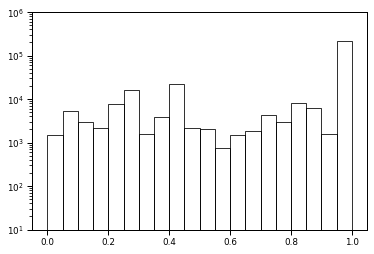

In [184]:
plt.hist(mannwhitneyresults[mannwhitneyresults.metric.str.contains('GCross_k2')].p_value, bins=20, fill=False, edgecolor='k')
plt.ylim([1e1, 1e6])
plt.yscale('log')
plt.savefig("pval_freq_GCrossk2.svg")

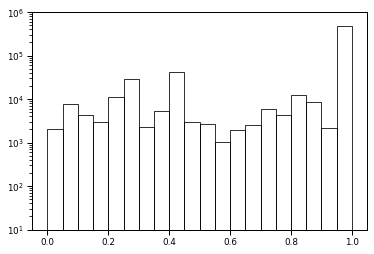

In [185]:
plt.hist(mannwhitneyresults[mannwhitneyresults.metric.str.contains('GCross_k3')].p_value, bins=20, fill=False, edgecolor='k')
plt.ylim([1e1, 1e6])
plt.yscale('log')
plt.savefig("pval_freq_GCrossk3.svg")

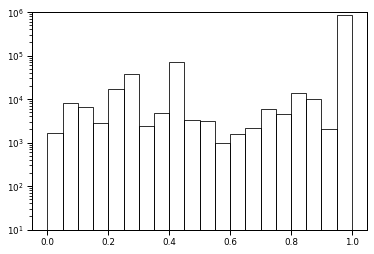

In [186]:
plt.hist(mannwhitneyresults[mannwhitneyresults.metric.str.contains('GCross_M')].p_value, bins=20, fill=False, edgecolor='k')
plt.ylim([1e1, 1e6])
plt.yscale('log')
plt.savefig("pval_freq_GCrossMBN.svg")

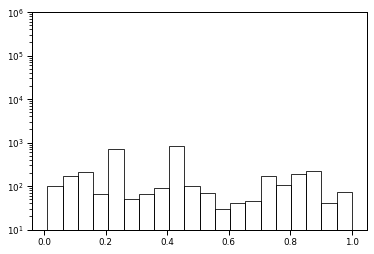

In [187]:
plt.hist(mannwhitneyresults[mannwhitneyresults.metric.str.contains('MetaG')].p_value, bins=20, fill=False, edgecolor='k')
plt.ylim([1e1, 1e6])
plt.yscale('log')
plt.savefig("pval_freq_MetaG.svg")

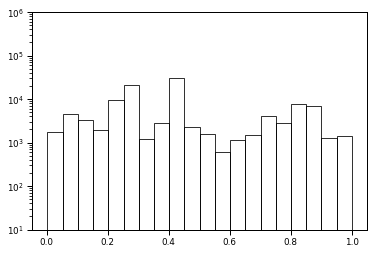

In [188]:
plt.hist(mannwhitneyresults[mannwhitneyresults.metric.str.contains('JSD')].p_value, bins=20, fill=False, edgecolor='k')
plt.ylim([1e1, 1e6])
plt.yscale('log')
plt.savefig("pval_freq_JSD.svg")

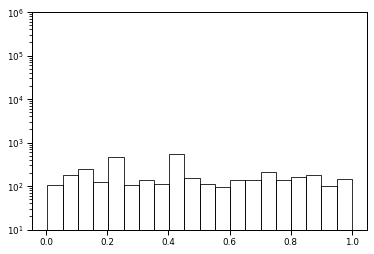

In [189]:
plt.hist(mannwhitneyresults[mannwhitneyresults.metric.str.contains('nb')].p_value, bins=20, fill=False, edgecolor='k')
plt.ylim([1e1, 1e6])
plt.yscale('log')
plt.savefig("pval_freq_nb.svg")

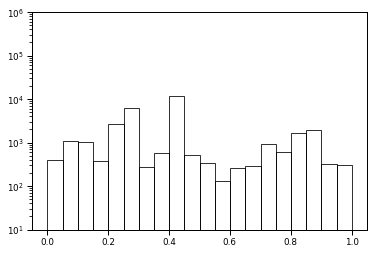

In [190]:
plt.hist(mannwhitneyresults[mannwhitneyresults.metric.str.contains('nratiob')].p_value, bins=20, fill=False, edgecolor='k')
plt.ylim([1e1, 1e6])
plt.yscale('log')
plt.savefig("pval_freq_nratiob.svg")

# Representative Figures

JSDScores_MPCNxImmunefuncxTumourfunc_NoNeighs_AllCells_1_tumorcells_cd4tregcells_PD1

In [164]:
dfFullValues.loc[:,['JSDScores_MPCNxImmunefuncxTumourfunc_NoNeighs_AllCells_0_cd8tcells_PD1_tumorcells_HLAA', 'patientid']].sort_values('JSDScores_MPCNxImmunefuncxTumourfunc_NoNeighs_AllCells_0_cd8tcells_PD1_tumorcells_HLAA')

,JSDScores_MPCNxImmunefuncxTumourfunc_NoNeighs_AllCells_0_cd8tcells_PD1_tumorcells_HLAA,patientid
11,0.448424,32343
40,0.472619,34718
19,0.558349,34673
47,0.562303,34743
5,0.572444,31267
30,0.580147,34697
7,0.583939,31584
34,0.606985,34703
54,0.637368,3892
21,0.642855,34680


In [219]:
dfFullValues.loc[:,dfFullValues.columns.str.contains('JSDScores_MPCNxImmunefuncxImmunefunc_NoNeighs_AllCells_0_tumorcells_cd4tcells_PD1')]

,JSDScores_MPCNxImmunefuncxImmunefunc_NoNeighs_AllCells_0_tumorcells_cd4tcells_PD1,JSDScores_MPCNxImmunefuncxImmunefunc_NoNeighs_AllCells_0_tumorcells_cd4tcells_PD1_ICOS
0,NaN,NaN
1,0.532724,NaN
2,0.646339,0.704393
3,NaN,NaN
4,0.675219,0.755007
5,0.626388,NaN
6,NaN,NaN
7,NaN,NaN
8,0.686722,NaN
9,0.835967,NaN


In [166]:
adata[adata.obs.patientid == 32343]
adata[adata.obs.patientid == 22333]

View of AnnData object with n_obs × n_vars = 2601 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfractions_

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


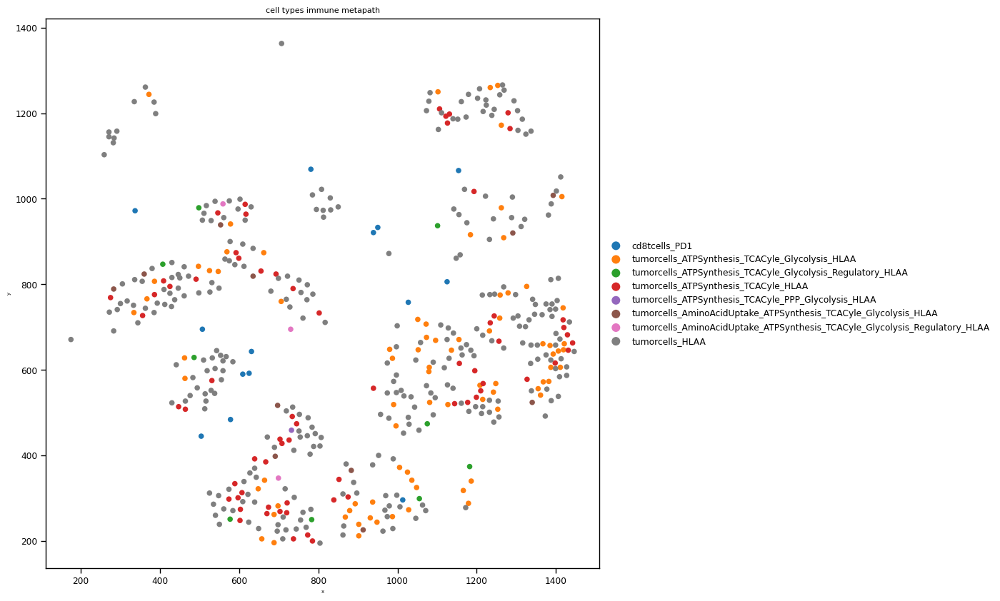

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


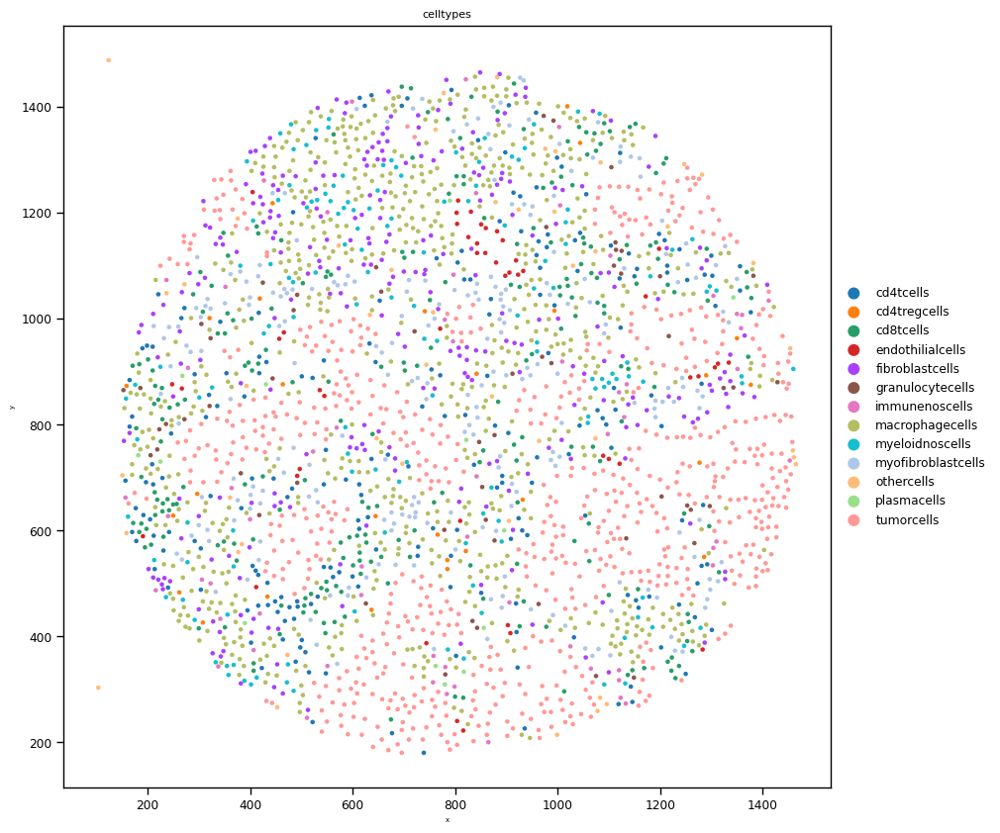

In [215]:
import scanpy as sc
#sc.pl.
fig, ax = plt.subplots(figsize=(10, 10))
mp = sc.pl.scatter(adata[(adata.obs.patientid == 32343) & ((adata.obs.Immune_func == 'cd8tcells_PD1') | (adata.obs.tumour_func == 'tumorcells_HLAA'))], x='x', y='y', color='cell_types_immune_metapath', size=120, ax=ax, save="cd8tcells_PD1_0p832.svg")

fig, ax = plt.subplots(figsize=(10, 10))
mp = sc.pl.scatter(adata[adata.obs.patientid == 32343], x='x', y='y', color='celltypes', ax=ax, save="celltypes_0p832.svg")


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


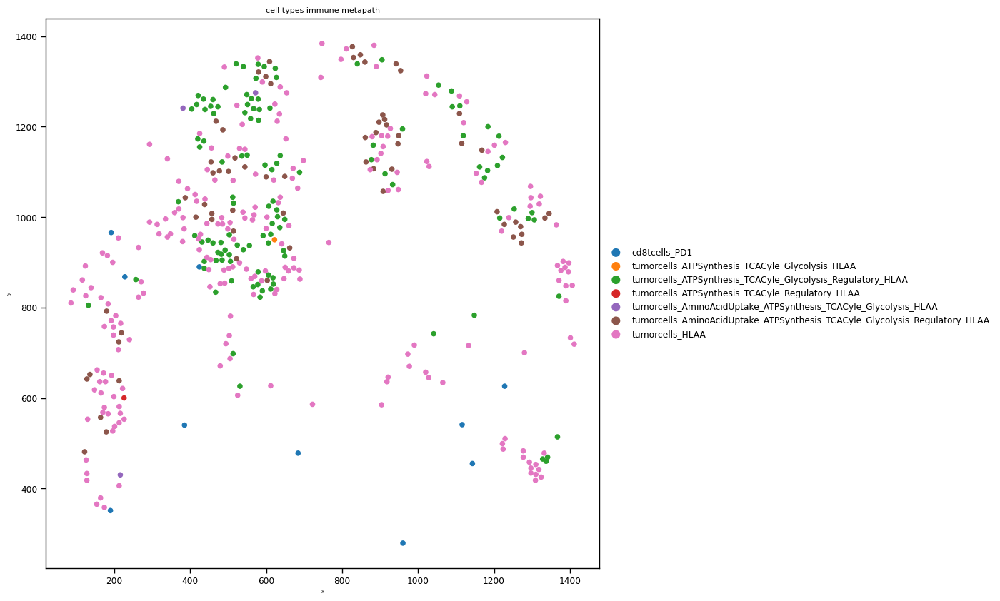

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


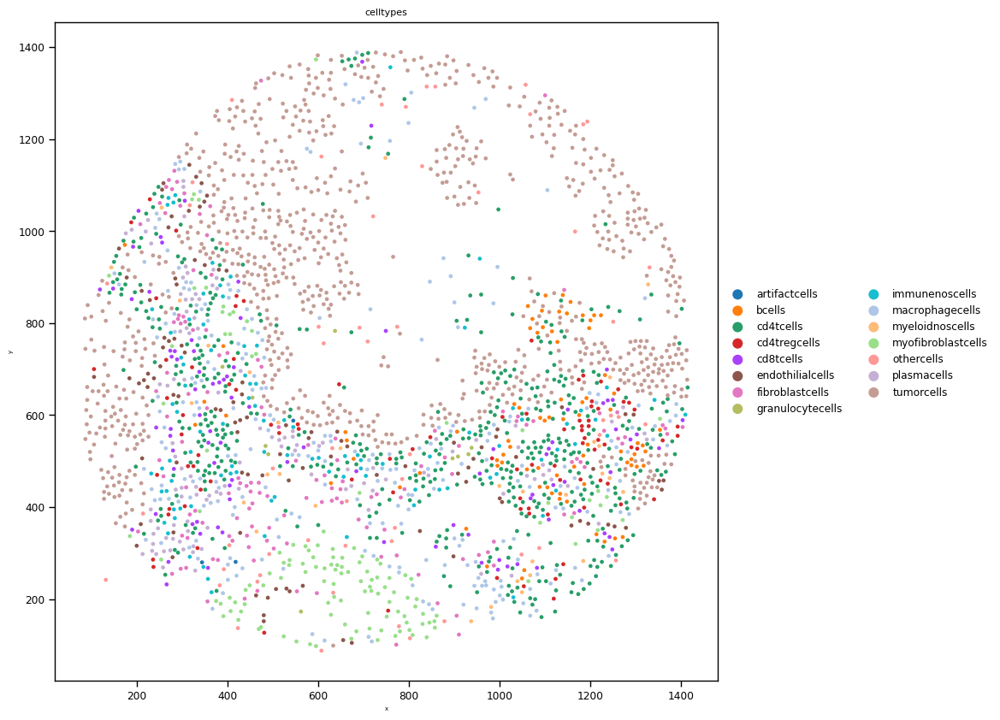

In [216]:
fig, ax = plt.subplots(figsize=(10, 10))
sc.pl.scatter(adata[(adata.obs.patientid == 22333) & ((adata.obs.Immune_func == 'cd8tcells_PD1') | (adata.obs.tumour_func == 'tumorcells_HLAA'))], x='x', y='y', color='cell_types_immune_metapath', size=120, ax=ax, save="cd8tcells_PD1_0p448.svg")

fig, ax = plt.subplots(figsize=(10, 10))
sc.pl.scatter(adata[adata.obs.patientid == 22333], x='x', y='y', color='celltypes', ax=ax, save="celltypes_0p449.svg")


In [227]:
dfFullValues.loc[:,['JSDScores_k2CNxCellsxCells_NoNeighs_AllCells_1_endothilialcells_macrophagecells', 'patientid']].sort_values('JSDScores_k2CNxCellsxCells_NoNeighs_AllCells_1_endothilialcells_macrophagecells')

,JSDScores_k2CNxCellsxCells_NoNeighs_AllCells_1_endothilialcells_macrophagecells,patientid
17,0.392384,34670
26,0.395983,34692
33,0.459755,34700
19,0.462674,34673
7,0.463093,31584
37,0.466724,34711
23,0.483994,34687
45,0.499571,34737
50,0.505938,34758
40,0.507270,34718


In [228]:
adata[adata.obs.patientid == 34670] #0.392
adata[adata.obs.patientid == 34694] #0.779

View of AnnData object with n_obs × n_vars = 1849 × 44
    obs: 'slideid', 'uuid', 'x', 'y', 'celltypes', 'newcelltypes', 'clusterid', 'neighborhoods', 'arearegion', 'Unnamed: 0', 'inclusion', 'patientid', 'filename', 'cohort', 'tumortype', 'prepost', 'histologytype', 'biopsysite', 'BOR', 'OR', 'CB6', 'PORvsFPD', 'pfs.T', 'pfs.E', 'os.T', 'os.E', 'pfs.6months', 'pfs.12months', 'OS.18months', 'OS.24months', 'Tissue', 'tumournontumour', 'Immune_func', 'Immune_meta', 'tumour_meta', 'tumour_func', 'cell_types_immune_metapath', 'ATPSynthesis', 'Glycolysis', 'TCACyle', 'Regulatory', 'AminoAcidUptake', 'FatOxidation', 'PPP', 'MetaPathNeighbourhood', 'nb_tumournontumour_20_3', 'nb_tumournontumour_50_2', 'cell_types_allmarkers', 'AminoAcidUptakeHigh', 'ATPSynthesisHigh', 'TCACyleHigh', 'FatOxidationHigh', 'GlycolysisHigh', 'RegulatoryHigh', 'PPPHigh', 'weights'
    uns: 'dendrogram_MetaPathNeighbourhood', 'dendrogram_celltypes', 'metabolic_gcross', 'metabolicfractions_CNs', 'metabolicfractions_

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


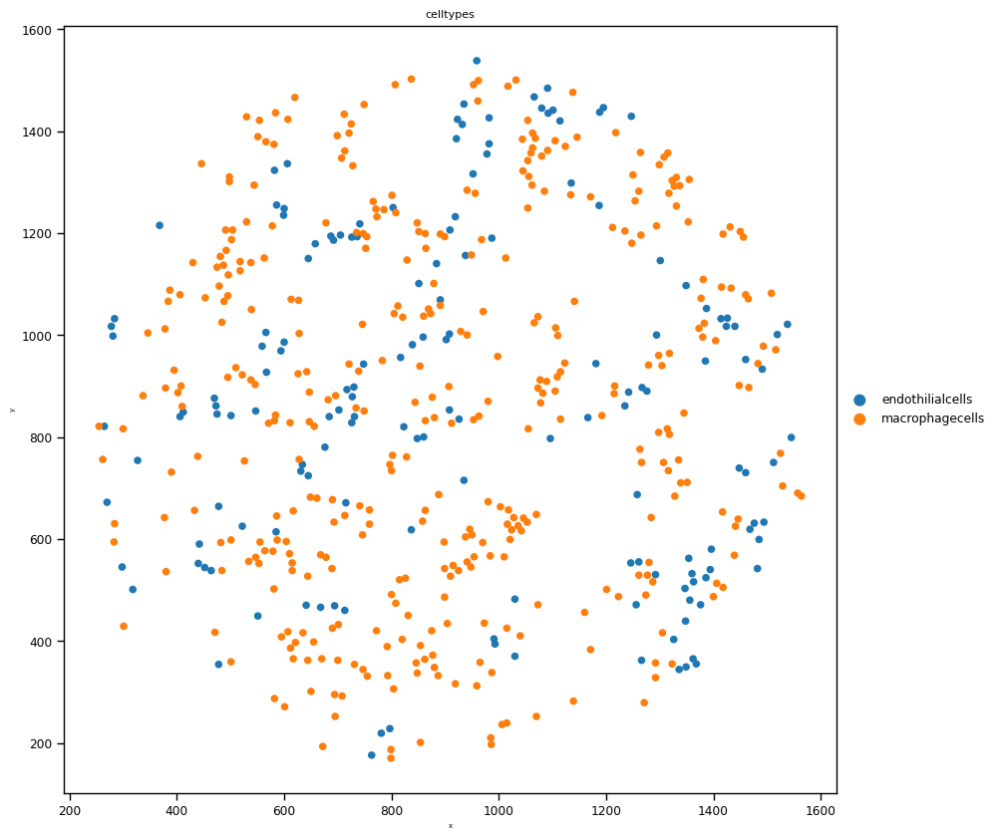

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


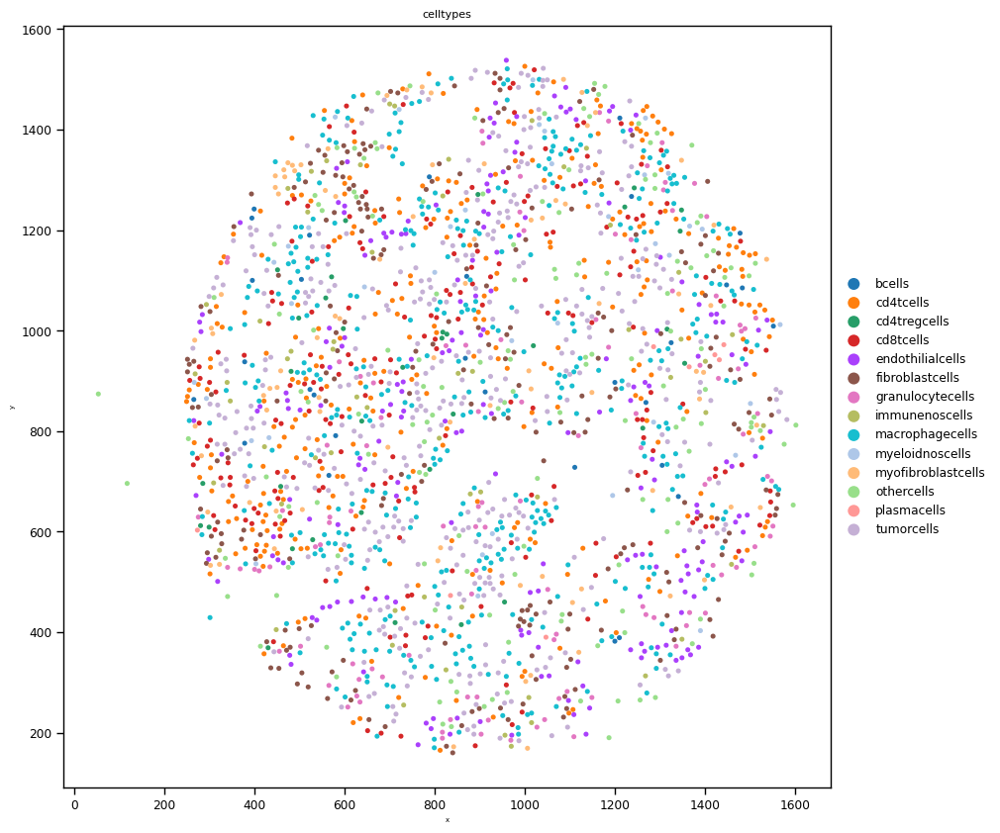

In [313]:
import scanpy as sc
#sc.pl.
fig, ax = plt.subplots(figsize=(10, 10))
mp = sc.pl.scatter(adata[(adata.obs.patientid == 34670) & ((adata.obs.Immune_func == 'endothilialcells') | (adata.obs.Immune_func == 'macrophagecells'))], x='x', y='y', color='celltypes', size=120, ax=ax, save="endothilialcells_macrophagecells_0p392.svg")

fig, ax = plt.subplots(figsize=(10, 10))
mp = sc.pl.scatter(adata[adata.obs.patientid == 34670], x='x', y='y', color='celltypes', ax=ax, save="celltypes_0p392.svg")


/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


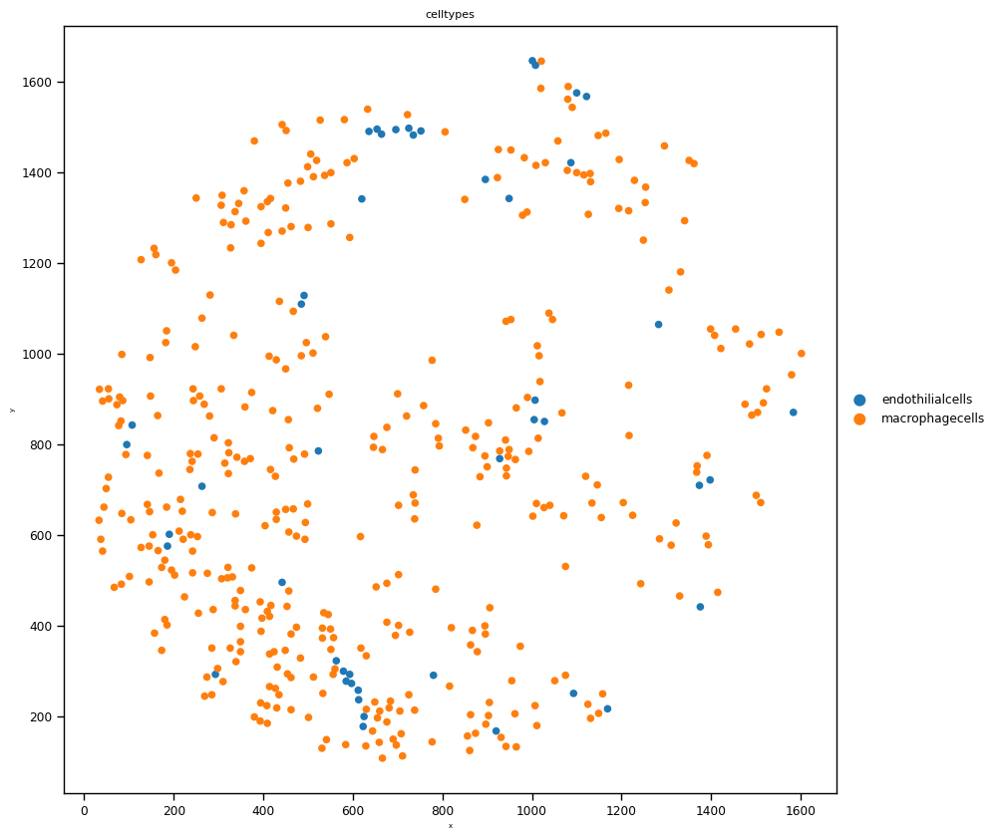

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


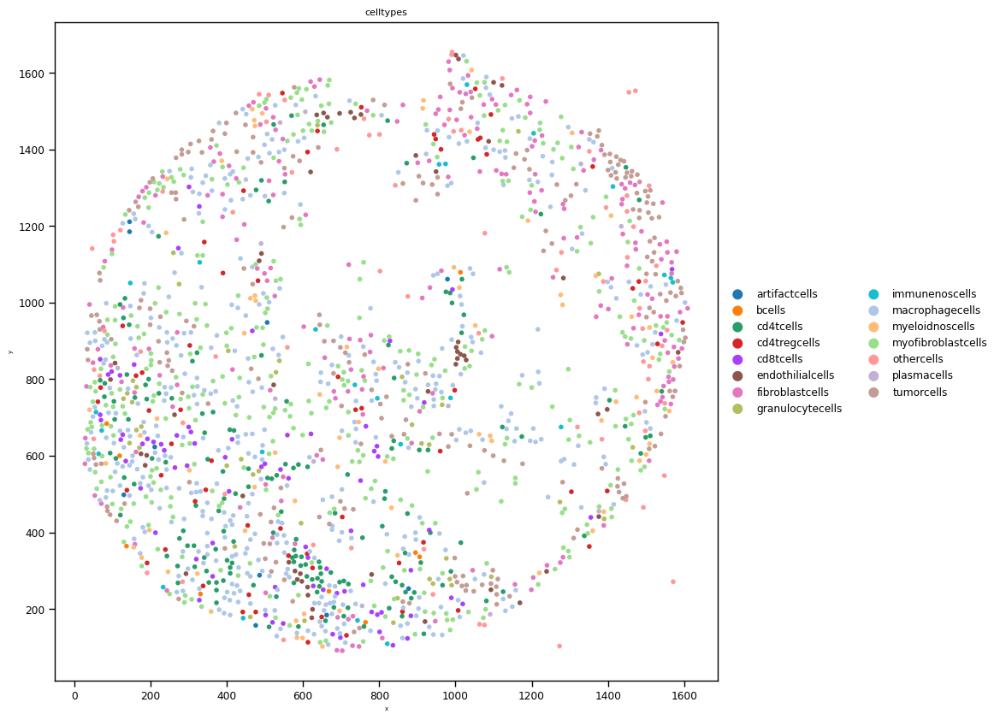

In [314]:
fig, ax = plt.subplots(figsize=(10, 10))
mp = sc.pl.scatter(adata[(adata.obs.patientid == 34694) & ((adata.obs.Immune_func == 'endothilialcells') | (adata.obs.Immune_func == 'macrophagecells'))], x='x', y='y', color='celltypes', size=120, ax=ax, save="endothilialcells_macrophagecells_0p779.svg")

fig, ax = plt.subplots(figsize=(10, 10))
mp = sc.pl.scatter(adata[adata.obs.patientid == 34694], x='x', y='y', color='celltypes', ax=ax, save="celltypes_0p779.svg")


In [315]:
## Plot the Kernel Densities

In [316]:
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from sklearn.neighbors import KernelDensity


In [309]:
kde = KernelDensity(kernel='gaussian', bandwidth=60, algorithm='kd_tree', leaf_size=100, atol=1e-9) \
    .fit(adata[(adata.obs.patientid == 34694) & ((adata.obs.Immune_func == 'endothilialcells'))].obs[['x', 'y']])

XX, YY = np.meshgrid(np.arange(0, 1600, 10), np.arange(0, 1600, 10))
ZZ = kde.score_samples([[x, y] for x, y in zip(XX.flatten(), YY.flatten())]).reshape(XX.shape)

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KernelDensity was fitted with feature names
  warnings.warn(


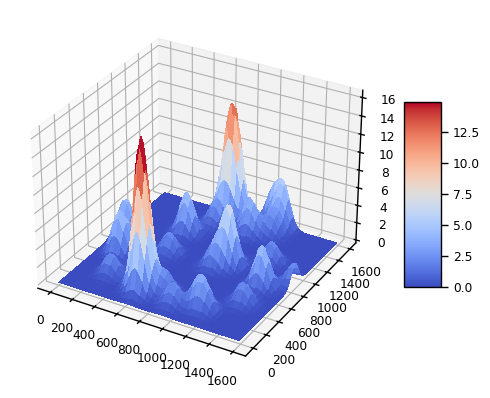

In [310]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
surf = ax.plot_surface(XX, YY, np.e**(ZZ)*1600*1600, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()

In [311]:
kde = KernelDensity(kernel='gaussian', bandwidth=60, algorithm='kd_tree', leaf_size=100, atol=1e-9) \
    .fit(adata[(adata.obs.patientid == 34694) & ((adata.obs.Immune_func == 'macrophagecells'))].obs[['x', 'y']])

XX, YY = np.meshgrid(np.arange(0, 1600, 10), np.arange(0, 1600, 10))
ZZ = kde.score_samples([[x, y] for x, y in zip(XX.flatten(), YY.flatten())]).reshape(XX.shape)

/home/akilgall/miniconda3/envs/analysis/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KernelDensity was fitted with feature names
  warnings.warn(


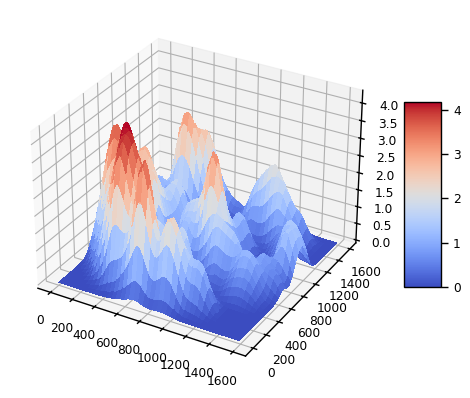

In [312]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
surf = ax.plot_surface(XX, YY, np.e**ZZ*1600*1600, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()